# Team 20: HCDR

# Home Credit Default Risk (HCDR)

The course project is based on the [Home Credit Default Risk (HCDR)  Kaggle Competition](https://www.kaggle.com/c/home-credit-default-risk/). The goal of this project is to predict whether or not a client will repay a loan. In order to make sure that people who struggle to get loans due to insufficient or non-existent credit histories have a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.


## Some of the challenges

1. Dataset size 
   * (688 meg uncompressed) with millions of rows of data
   * 2.71 Gig of data uncompressed
* Dealing with missing data
* Imbalanced datasets
* Summarizing transaction data


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pwd

/content


# Kaggle API setup
Kaggle is a Data Science Competition Platform which shares a lot of datasets. In the past, it was troublesome to submit your result as your have to go through the console in your browser and drag your files there. Now you can interact with Kaggle via the command line. E.g., 

```bash
! kaggle competitions files home-credit-default-risk
```

It is quite easy to setup, it takes me less than 15 minutes to finish a submission.

1. Install library
* Create a API Token (edit your profile on [Kaggle.com](https://www.kaggle.com/)); this produces `kaggle.json` file
* Put your JSON `kaggle.json` in the right place
* Access competition files; make submissions via the command (see examples below)
* Submit result

For more detailed information on setting the Kaggle API see [here](https://medium.com/@nokkk/make-your-kaggle-submissions-with-kaggle-official-api-f49093c04f8a) and [here](https://github.com/Kaggle/kaggle-api).



In [ ]:
DATA_DIR = "./drive/MyDrive/HCDR_Phase_1_baseline_submission"
!ls -l $DATA_DIR

total 2621352
-rw------- 1 root root  26567651 Dec 11  2019 application_test.csv
-rw------- 1 root root 166133370 Dec 11  2019 application_train.csv
-rw------- 1 root root 375592889 Dec 11  2019 bureau_balance.csv
-rw------- 1 root root 170016717 Dec 11  2019 bureau.csv
-rw------- 1 root root 424582605 Dec 11  2019 credit_card_balance.csv
-rw------- 1 root root     37383 Dec 11  2019 HomeCredit_columns_description.csv
-rw------- 1 root root 723118349 Dec 11  2019 installments_payments.csv
-rw------- 1 root root 392703158 Dec 11  2019 POS_CASH_balance.csv
-rw------- 1 root root 404973293 Dec 11  2019 previous_application.csv
-rw------- 1 root root    536202 Dec 11  2019 sample_submission.csv


In [ ]:
import numpy as np
import pandas as pd 
from sklearn.preprocessing import LabelEncoder
import missingno as msno
import os
import zipfile
from sklearn.base import BaseEstimator, TransformerMixin
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline, FeatureUnion
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
import warnings
import gc
warnings.filterwarnings('ignore')

Commonly Used Functions for the Project

In [ ]:
# Refer :- https://www.kaggle.com/rinnqd/reduce-memory-usage
#As we were Facing issues with Kernel Crashing Using Phase 2, we found this solution to reduce memory usage
def reduce_memory(df):
    mem_before = df.memory_usage().sum() / 1024**2
    print("Memory Usage of DataFrame is "+ str(mem_before))
    
    for col in df.columns:
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                #Check if  Column can be interpreted using int8
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                #Check if  Column can be interpreted using int16
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                #Check if  Column can be interpreted using int32
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                #Use  Int64 if no conditions match
                else:
                    df[col] = df[col].astype(np.int64)  
            else:
                #Check if  Column can be interpreted using Float 16
                if c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                #Check if  Column can be interpreted using float32
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                #Use float64 instead
                else:
                    df[col] = df[col].astype(np.float64)

    mem_after = df.memory_usage().sum() / 1024**2
    print("Memory Usage of DataFrame After Optimization is "+ str(mem_after))
    return df

In [ ]:
def ohe(df):
  cat_df=df.select_dtypes(include='object')
  cat_cols=cat_df.columns
  df=pd.get_dummies(df,columns=cat_cols,dummy_na=False)
  return df


In [ ]:
def rename(df,name):
  df.columns=pd.Index([name + "_"+ col for col in list(df.columns)])
  df.rename(columns={name+"_SK_ID_CURR":"SK_ID_CURR"},inplace=True)

In [ ]:
#stacked bar plots matplotlib: https://matplotlib.org/gallery/lines_bars_and_markers/bar_stacked.html
#https://medium.com/analytics-vidhya/home-credit-default-risk-part-1-business-understanding-data-cleaning-and-eda-1203913e979c
def stack_plot(data, xtick, col2='TARGET', col3='total'):
    ind = np.arange(data.shape[0])
    
    if len(data[xtick].unique())<5:
        plt.figure(figsize=(5,5))
    elif len(data[xtick].unique())>5 & len(data[xtick].unique())<10:
        plt.figure(figsize=(7,7))
    else:
        plt.figure(figsize=(15,15))
    p1 = plt.bar(ind, data[col3].values,color=['Black'])
    p2 = plt.bar(ind, data[col2].values,color=['Red'])
    plt.ylabel('Loans')
    plt.title('Loans Approved vs Rejected')
    plt.xticks(ticks=ind,rotation=90,labels= list(data[xtick].values))
    plt.legend((p1[0], p2[0]), ('CAPABLE', 'INCAPABLE'))
    plt.show()
    
    
def univariate_barplots(data, col1, col2='TARGET', top=False):
    
    temp = pd.DataFrame(data.groupby(col1)[col2].agg(lambda x: x.eq(1).sum())).reset_index()
    temp['total'] = pd.DataFrame(data.groupby(col1)[col2].agg(total='count')).reset_index()['total']
    temp['Avg'] = pd.DataFrame(data.groupby(col1)[col2].agg(Avg='mean')).reset_index()['Avg']  
    temp.sort_values(by=['total'],inplace=True, ascending=False)  
    if top:
        temp = temp[0:top]  
    stack_plot(temp, xtick=col1, col2=col2, col3='total')
    print(temp.head(5))
    print("="*50)
    print(temp.tail(5))

def stack_plot_dist(data, xtick, col2='TARGET', col3='total'):
    ind = np.arange(data.shape[0])
    
    if len(data[xtick].unique())<5:
        plt.figure(figsize=(5,5))
    elif len(data[xtick].unique())>5 & len(data[xtick].unique())<10:
        plt.figure(figsize=(7,7))
    else:
        plt.figure(figsize=(15,15))
    p1 = plt.bar(ind, data[col3].values,color=['Black'])
    p2 = plt.bar(ind, data[col2].values,color=['Red'])
    plt.ylabel('Loans')
    plt.title('Loans Approved vs Rejected')
    plt.xticks(ticks=ind,rotation=90,labels= list(data[xtick].values))
    plt.legend((p1[0], p2[0]), ('CAPABLE', 'INCAPABLE'))
    plt.show()

# Dataset and how to download


## Back ground Home Credit Group

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

### Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.


## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.

The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.

Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

* __application_train/application_test:__ the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating __0: the loan was repaid__ or __1: the loan was not repaid__. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

## Downloading the files via Kaggle API

Create a base directory:

```bash
DATA_DIR = "../../../Data/home-credit-default-risk"   #same level as course repo in the data directory
```

Please download the project data files and data dictionary and unzip them using either of the following approaches:

1. Click on the `Download` button on the following [Data Webpage](https://www.kaggle.com/c/home-credit-default-risk/data) and unzip the  zip file to the `BASE_DIR`
2. If you plan to use the Kaggle API, please use the following steps.


In [ ]:
def load_data(in_path, name):
    df = reduce_memory(pd.read_csv(in_path))
    print(f"{name}: shape is {df.shape}")
    #print(df.info(verbose=True))
    #display(df.head(5))
    return df

In [ ]:
ds_names = ("application_train", "application_test", "bureau","bureau_balance","credit_card_balance","installments_payments",
            "previous_application","POS_CASH_balance")

In [ ]:
datasets={}  
for ds_name in ds_names:
    datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)

Memory Usage of DataFrame is 286.2270965576172
Memory Usage of DataFrame After Optimization is 92.37870502471924
application_train: shape is (307511, 122)
Memory Usage of DataFrame is 44.99847412109375
Memory Usage of DataFrame After Optimization is 14.596694946289062
application_test: shape is (48744, 121)
Memory Usage of DataFrame is 222.62033081054688
Memory Usage of DataFrame After Optimization is 112.94713973999023
bureau: shape is (1716428, 17)
Memory Usage of DataFrame is 624.845817565918
Memory Usage of DataFrame After Optimization is 338.45820713043213
bureau_balance: shape is (27299925, 3)
Memory Usage of DataFrame is 673.8829956054688
Memory Usage of DataFrame After Optimization is 289.3302688598633
credit_card_balance: shape is (3840312, 23)
Memory Usage of DataFrame is 830.4078979492188
Memory Usage of DataFrame After Optimization is 311.40303802490234
installments_payments: shape is (13605401, 8)
Memory Usage of DataFrame is 471.48081970214844
Memory Usage of DataFrame Af

### The Other datasets

* __bureau:__ data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
* __bureau_balance:__ monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
* __previous_application:__ previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
* __POS_CASH_BALANCE:__ monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
* credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
* __installments_payment:__ payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

<h2> Exploratory Data Analysis and Visual EDA </h2>

<h3> Applicaton Train File </h3>

<h5> Description of Numerical  Features in Application Train</h5>

In [ ]:
datasets['application_train'].describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,...,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.0,307511.000000,104582.0,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.0,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,...,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.0,306490.000000,306490.0,306490.000000,307510.0,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.0,265992.0,265992.0
mean,278180.518577,0.080729,0.417052,1.687391e+05,5.988308e+05,27110.958984,5.379796e+05,0.020859,-16036.995067,63815.045904,NaN,-2994.202373,NaN,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,NaN,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,NaN,NaN,NaN,0.117493,0.088440,NaN,NaN,0.044647,0.078918,0.149536,0.226440,...,0.149170,0.225952,0.231934,0.067261,0.101929,0.108643,0.008652,0.028259,0.102478,NaN,0.143188,NaN,0.100098,NaN,0.000042,0.710023,0.000081,0.015115,0.088055,0.000192,0.081376,0.003896,0.000023,0.003912,0.000007,0.003525,0.002936,0.00121,0.009928,0.000267,0.008130,0.000595,0.000507,0.000335,0.006401,0.007000,0.034302,NaN,NaN,NaN
std,102790.175348,0.272419,0.722121,2.371759e+05,4.024795e+05,14493.233398,3.695427e+05,0.013824,4363.988632,141275.766519,NaN,1509.450419,0.0,0.001803,0.384280,0.399526,0.043164,0.449521,0.231307,0.0,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444,0.421124,0.383817,0.000000,0.000000e+00,0.000000,0.108276,0.082458,0.000000,0.000000,0.076050,0.134521,0.100098,0.144531,...,0.100342,0.145020,0.161987,0.082153,0.093689,0.112305,0.047394,0.070129,0.107361,NaN,0.446533,NaN,0.362549,NaN,0.006502,0.453752,0.009016,0.122010,0.283376,0.013850,0.273412,0.062295,0.004771,0.062424,0.002550,0.059268,0.054110,0.03476,0.099144,0.016327,0.089798,0.024387,0.022518,0.018299,0.083984,0.110718,0.204712,0.0,NaN,0.0
min,100002.000000,0.000000,0.000000,2.565000e+04,4.500000e+

Describing All Features of Application Train

In [ ]:
datasets["application_train"].describe(include='all')

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,...,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511,307511,307511,307511,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,306219,307511,307511,307511,307511,307511.000000,307511.000000,307511.000000,307511.0,307511.000000,104582.0,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,211120,307509.0,307511.000000,307511.000000,307511,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,...,97312.000000,153161.000000,93997.000000,137829.000000,97216,153214,159080.000000,151170,161756,306490.0,306490.000000,306490.0,306490.000000,307510.0,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.0,265992.0,265992.0
unique,NaN,NaN,2,3,2,2,NaN,NaN,NaN,NaN,NaN,7,8,5,6,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,4,3,NaN,7,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,F,N,Y,NaN,NaN,NaN,NaN,NaN,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Laborers,NaN,NaN,NaN,TUESDAY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,reg oper account,block of flats,NaN,Panel,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,278232,202448,202924,213312,NaN,NaN,NaN,NaN,NaN,248526,158774,218391,196432,272868,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,55186,NaN,NaN,NaN,53901,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,73830,150503,NaN,66040,159428,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,278180.518577,0.080729,NaN,NaN,NaN,NaN,0.417052,1.687391e+05,5.988308e+05,27110.958984,5.379796e+05,NaN,NaN,NaN,NaN,NaN,0.020859,-16036.995067,63815.045904,NaN,-2994.202373,NaN,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,NaN,NaN,2.052463,2.031521,NaN,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,...,0.101929,0.108643,0.008652,0.028259,NaN,NaN,0.102478,NaN,NaN,NaN,0.143188,NaN,0.100098,NaN,0.000042,0.710023,0.

<h4> Missing Values in Application Train </h4>

In [ ]:
sum_missing = (datasets["application_train"].isna().sum())
sum_missing

SK_ID_CURR                        0
TARGET                            0
NAME_CONTRACT_TYPE                0
CODE_GENDER                       0
FLAG_OWN_CAR                      0
                              ...  
AMT_REQ_CREDIT_BUREAU_DAY     41519
AMT_REQ_CREDIT_BUREAU_WEEK    41519
AMT_REQ_CREDIT_BUREAU_MON     41519
AMT_REQ_CREDIT_BUREAU_QRT     41519
AMT_REQ_CREDIT_BUREAU_YEAR    41519
Length: 122, dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 67


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

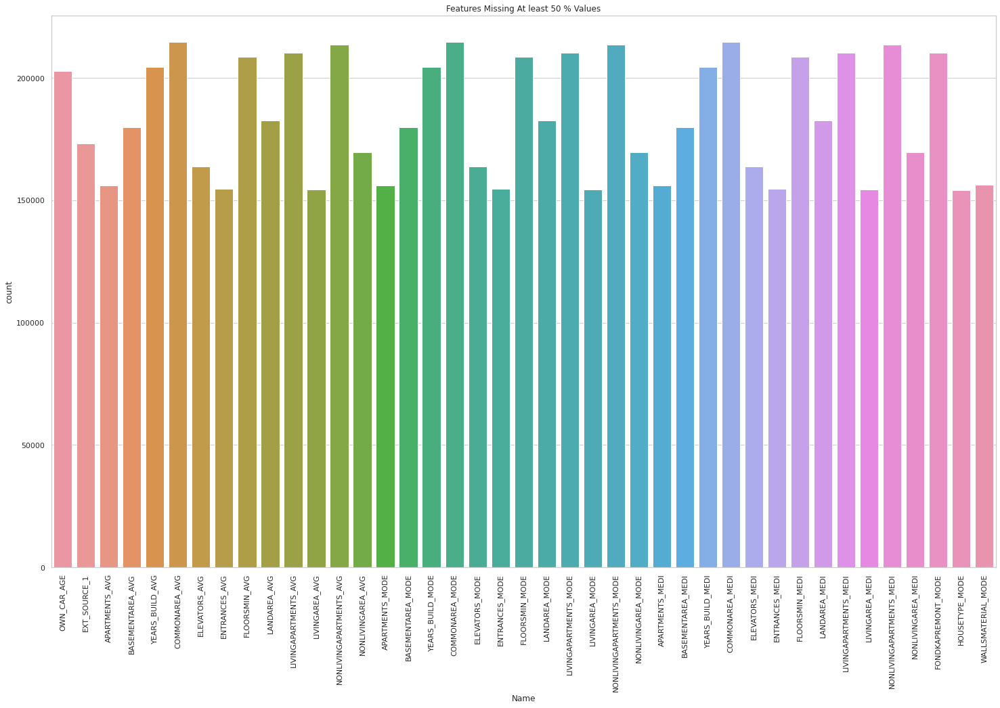

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing[sum_missing['count']>len(datasets['application_train'])/2]).set(title='Features Missing At least 50 % Values')
plt.xticks(rotation = 90)
plt.show()

Target Value Distribution

<h3> Observations from Missing Features graph </h3>

We observed that 67 features are missing al least 1 value. 41 features are missing at least 50% values

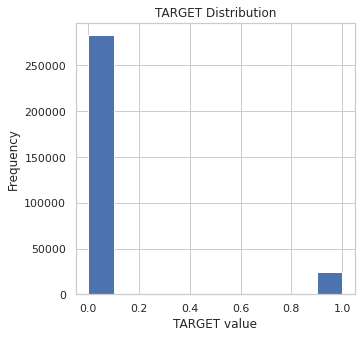

In [ ]:
plt.figure(figsize=(5,5))
datasets["application_train"]['TARGET'].plot.hist(label=True);
plt.title('TARGET Distribution')
plt.xlabel('TARGET value')
plt.ylabel('Frequency');
plt.show()

The target distribution is higly skewed and approximately 91% data has target variable 0

<h4> Feauture Analysis of Application Train Features </h4>

Univariate Analysis on NAME_CONTRACT_TYPE

**1. Analysis on NAME_CONTRACT_TYPE**

NAME_CONTRACT_TYPE : Contract product type of the loan application 

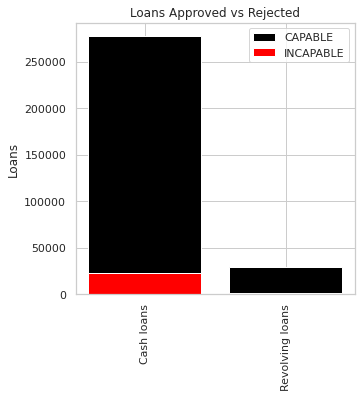

  NAME_CONTRACT_TYPE  TARGET   total       Avg
0         Cash loans   23221  278232  0.083459
1    Revolving loans    1604   29279  0.054783
  NAME_CONTRACT_TYPE  TARGET   total       Avg
0         Cash loans   23221  278232  0.083459
1    Revolving loans    1604   29279  0.054783


In [ ]:
univariate_barplots(datasets['application_train'], 'NAME_CONTRACT_TYPE', col2='TARGET', top=False)

**Observations**
The number of Cash Loans taken by individuals is more than the revolving type loans.

Univariate Analysis on Gender

**2. Univariate Analysis on Gender**

CODE_GENDER : The Gender of the Applicant

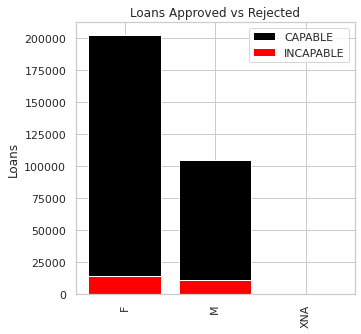

  CODE_GENDER  TARGET   total       Avg
0           F   14170  202448  0.069993
1           M   10655  105059  0.101419
2         XNA       0       4  0.000000
  CODE_GENDER  TARGET   total       Avg
0           F   14170  202448  0.069993
1           M   10655  105059  0.101419
2         XNA       0       4  0.000000


In [ ]:
univariate_barplots(datasets['application_train'], 'CODE_GENDER', col2='TARGET', top=False)

Univariate Analysis on Possesion of Vehicle

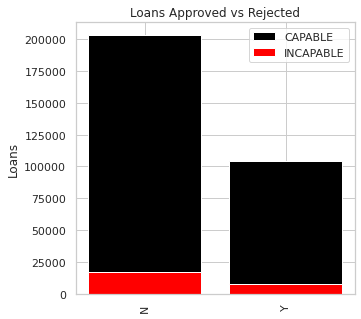

  FLAG_OWN_CAR  TARGET   total       Avg
0            N   17249  202924  0.085002
1            Y    7576  104587  0.072437
  FLAG_OWN_CAR  TARGET   total       Avg
0            N   17249  202924  0.085002
1            Y    7576  104587  0.072437


In [ ]:
univariate_barplots(datasets['application_train'], 'FLAG_OWN_CAR', col2='TARGET', top=False)

**Observations**  

1) The number of loans taken by females is much more than that of Males.

2) Loan applications of women is approximately equal to 200k whereas male applicants have 100K applications approximately

3) Men are capable to pay loans in a better fashion compared to women.

4) XNA gender is where the gender of applicant is not specified. These values can be imputed later in the pipelines

Univariate Analysis on Possesion of House

**3. Univariate Analysis on Possesion of Vehicle**

FLAG_OWN_CAR : Does the applicant own a car or not ?

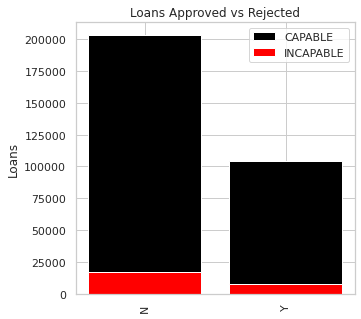

  FLAG_OWN_CAR  TARGET   total       Avg
0            N   17249  202924  0.085002
1            Y    7576  104587  0.072437
  FLAG_OWN_CAR  TARGET   total       Avg
0            N   17249  202924  0.085002
1            Y    7576  104587  0.072437


In [ ]:
univariate_barplots(datasets['application_train'], 'FLAG_OWN_CAR', col2='TARGET', top=False)

**Observations**

1) Most applicants don't have a car.

2) The applicants who don't own a car have very little difference is the repayment of loans.

Univariate Analysis on Number of Children

**5. Univariate Analysis on Number of Children**
CNT_CHILDREN : The number of children which the applicant has

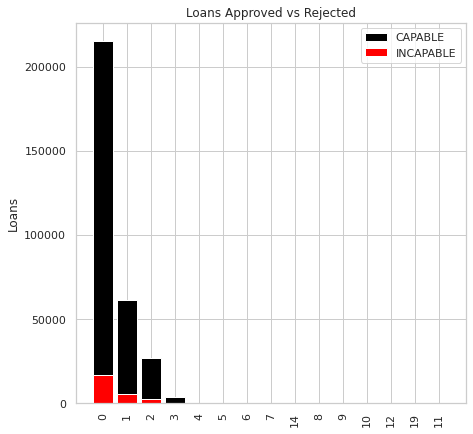

   CNT_CHILDREN  TARGET   total       Avg
0             0   16609  215371  0.077118
1             1    5454   61119  0.089236
2             2    2333   26749  0.087218
3             3     358    3717  0.096314
4             4      55     429  0.128205
    CNT_CHILDREN  TARGET  total  Avg
9              9       2      2  1.0
10            10       0      2  0.0
12            12       0      2  0.0
14            19       0      2  0.0
11            11       1      1  1.0


In [ ]:
univariate_barplots(datasets['application_train'], 'CNT_CHILDREN', col2='TARGET', top=False)

**Observations**
1. Applicants with no children take larger amount of loans
2. Applicants with no children are more capable of repayment

Univariate Analysis on Dependents

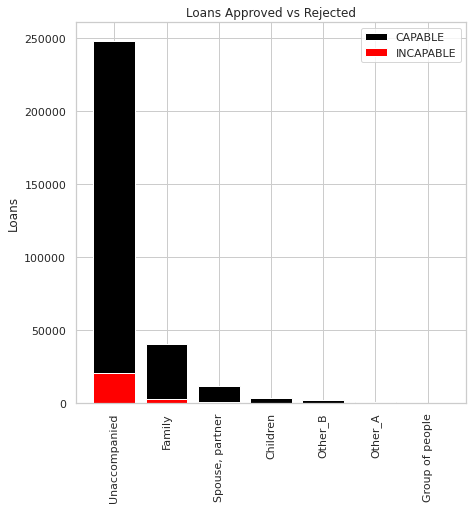

   NAME_TYPE_SUITE  TARGET   total       Avg
6    Unaccompanied   20337  248526  0.081830
1           Family    3009   40149  0.074946
5  Spouse, partner     895   11370  0.078716
0         Children     241    3267  0.073768
4          Other_B     174    1770  0.098305
   NAME_TYPE_SUITE  TARGET  total       Avg
5  Spouse, partner     895  11370  0.078716
0         Children     241   3267  0.073768
4          Other_B     174   1770  0.098305
3          Other_A      76    866  0.087760
2  Group of people      23    271  0.084871


In [ ]:
univariate_barplots(datasets['application_train'], 'NAME_TYPE_SUITE', col2='TARGET', top=False)

**Observations**
1. A lot of applicants who came unaccompanied took more loans
2. Unaccompanied Applicants have more capability of paying loans

Univariate Analysis on Income Type

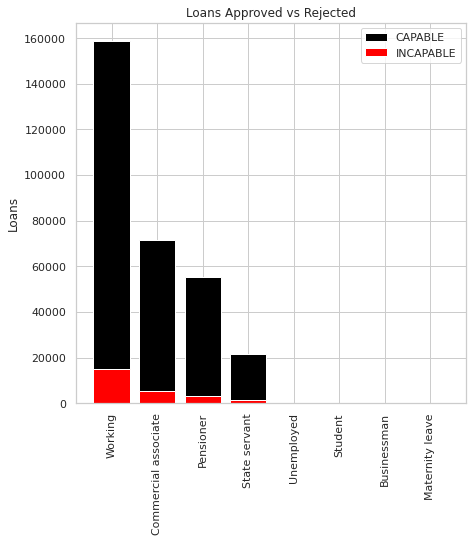

       NAME_INCOME_TYPE  TARGET   total       Avg
7               Working   15224  158774  0.095885
1  Commercial associate    5360   71617  0.074843
3             Pensioner    2982   55362  0.053864
4         State servant    1249   21703  0.057550
6            Unemployed       8      22  0.363636
  NAME_INCOME_TYPE  TARGET  total       Avg
4    State servant    1249  21703  0.057550
6       Unemployed       8     22  0.363636
5          Student       0     18  0.000000
0      Businessman       0     10  0.000000
2  Maternity leave       2      5  0.400000


In [ ]:
univariate_barplots(datasets['application_train'], 'NAME_INCOME_TYPE', col2='TARGET', top=False)

**Observations**
1. The people who are working took more loans and were more capable of repayment compared to other types

Univariate Analysis on Family Status

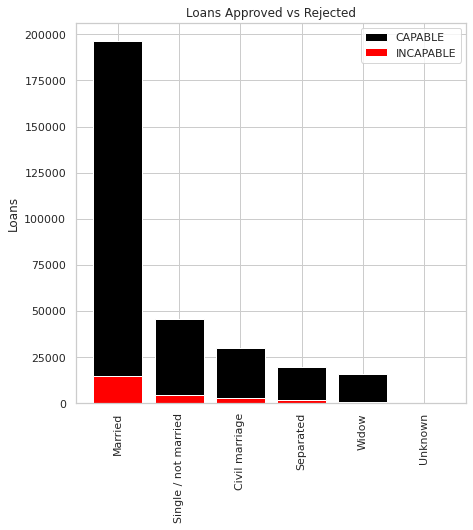

     NAME_FAMILY_STATUS  TARGET   total       Avg
1               Married   14850  196432  0.075599
3  Single / not married    4457   45444  0.098077
0        Civil marriage    2961   29775  0.099446
2             Separated    1620   19770  0.081942
5                 Widow     937   16088  0.058242
     NAME_FAMILY_STATUS  TARGET  total       Avg
3  Single / not married    4457  45444  0.098077
0        Civil marriage    2961  29775  0.099446
2             Separated    1620  19770  0.081942
5                 Widow     937  16088  0.058242
4               Unknown       0      2  0.000000


In [ ]:
univariate_barplots(datasets['application_train'], 'NAME_FAMILY_STATUS', col2='TARGET', top=False)

**Observations**
1. Married People took more loans
2. Married people had more capability of repayment

<h3> Observations from Above Plots </h3>

<h3> Analysis on Numerical Features : AMT_CREDIT </h3>

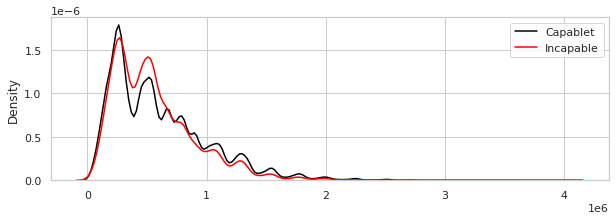

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['AMT_CREDIT'].values,hist=False,label="Capablet", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['AMT_CREDIT'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

**Observations**
Credit Amount taken from most loans is less than 10 lakhs

<h3> Analysis on Numerical Features : AMT_ANNUITY </h3>

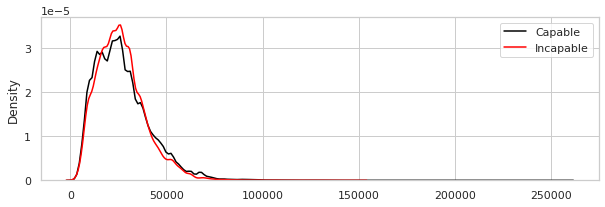

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['AMT_ANNUITY'].values,hist=False,label="Capable", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['AMT_ANNUITY'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

**Observations**
Most people pay below 50K in loans

<h3> Analysis on Numerical Features : AMT_GOODS_PRICE </h3>

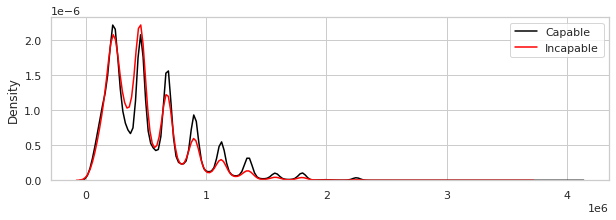

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['AMT_GOODS_PRICE'].values,hist=False,label="Capable", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['AMT_GOODS_PRICE'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

**Observations**
Most loans are approved when the product to be purchased is below 10lakhs

<h3> Client Age Distribution </h3>

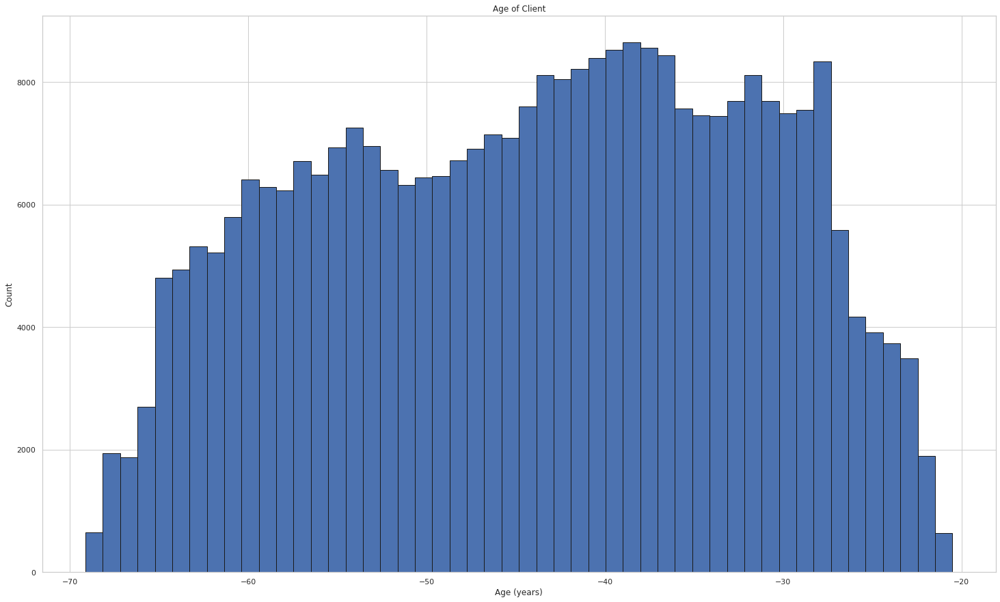

In [ ]:
plt.hist(datasets["application_train"]['DAYS_BIRTH'] /365, edgecolor = 'k', bins = 50)
plt.title('Age of Client'); plt.xlabel('Age (years)'); plt.ylabel('Count');
plt.show()

**Observations**
People who take more loans are in the age range : 25 to 65 

<h3>Client Occupation Distributon</h3>

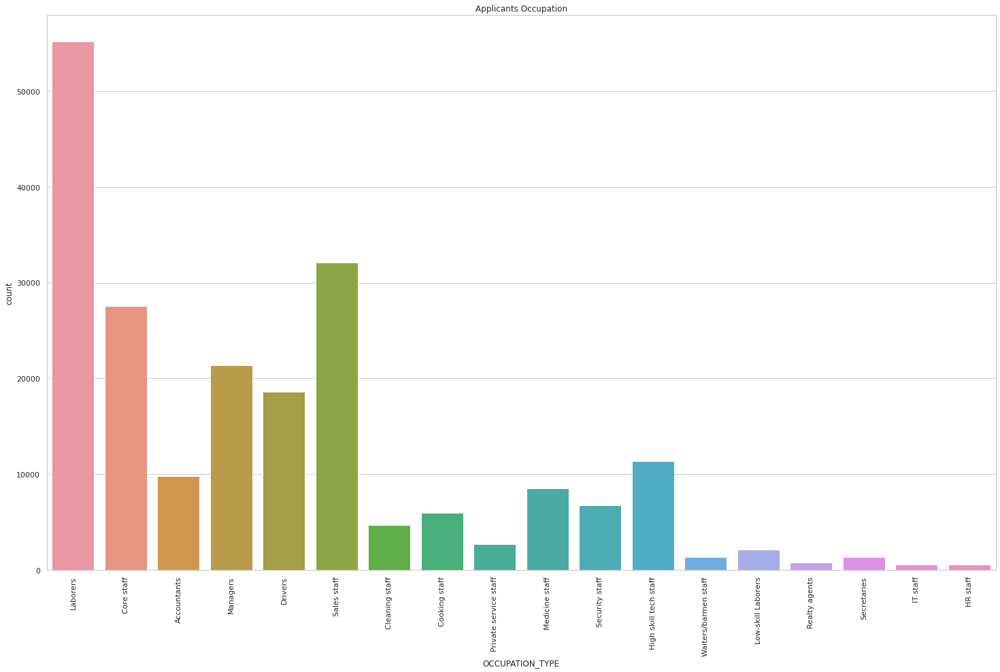

In [ ]:
sns.countplot(x='OCCUPATION_TYPE', data=datasets["application_train"]);
plt.title('Applicants Occupation');
plt.xticks(rotation=90);
plt.show()

**Observations**
Distribution of Occupation of Applicants are displayed : Laborers have the most amount of applications

Analysis on External Sources : EXT_SOURCE1, EXT_SOURCE2, EXT_SOURCE3

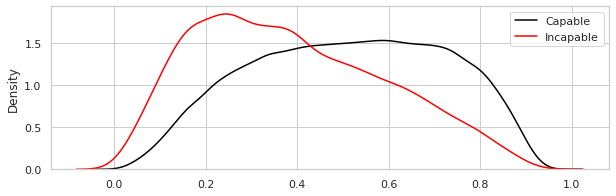

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['EXT_SOURCE_1'].values,hist=False,label="Capable", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['EXT_SOURCE_1'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

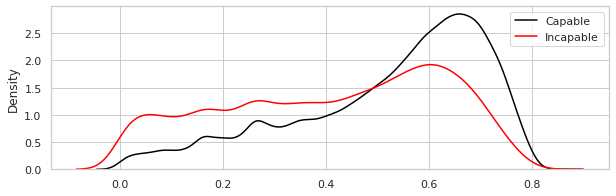

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['EXT_SOURCE_2'].values,hist=False,label="Capable", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['EXT_SOURCE_2'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

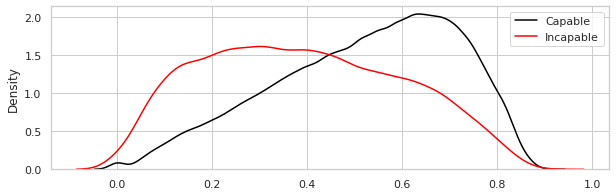

In [ ]:
plt.figure(figsize=(10,3))
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==0]['EXT_SOURCE_3'].values,hist=False,label="Capable", color='black')
sns.distplot(datasets['application_train'][datasets['application_train']['TARGET']==1]['EXT_SOURCE_3'].values,hist=False,label="Incapable", color='red')
plt.legend()
plt.show()

**Observations**
1) The Probabiltity Distribution Plots of EXT_SOURCE1, EXT_SOURCE2 and EXT_SOURCE3 : which are the external sources of income 

Analysis of AMT_CCREDIT vs AMT_ANNUITY

<h2> Scatterplot Analysis of AMT_CCREDIT vs AMT_ANNUITY </h2>

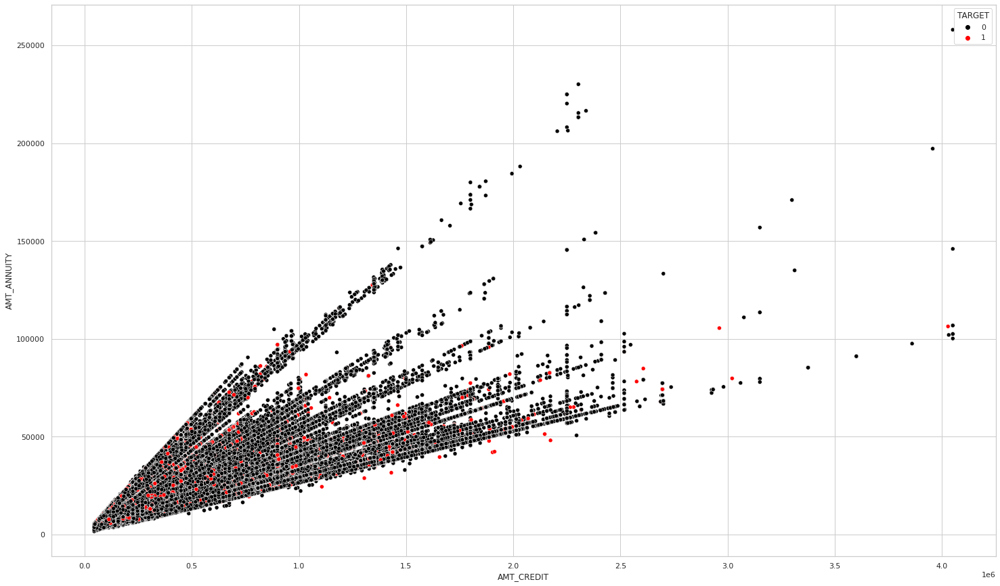

In [ ]:
sns.scatterplot(data=datasets['application_train'], x="AMT_CREDIT", y="AMT_ANNUITY", hue="TARGET",sizes=(20, 200),palette=['BLACK','RED'])

<h2> Bureau and Bureau Balance Files EDA <h2>

In [ ]:
datasets['bureau'].describe()

,SK_ID_CURR,SK_ID_BUREAU,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1.716428e+06,1.716428e+06,1610875.0,1082775.0,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1.716428e+06,4.896370e+05
mean,2.782149e+05,5.924434e+06,-1.142108e+03,8.181666e-01,NaN,NaN,3.825358e+03,6.410406e-03,3.545773e+05,1.370818e+05,6.229781e+03,3.791263e+01,-5.937483e+02,1.571327e+04
std,1.029386e+05,5.322657e+05,7.951649e+02,3.654443e+01,NaN,NaN,2.059873e+05,9.622391e-02,1.150277e+06,6.790749e+05,4.489666e+04,5.937519e+03,7.207473e+02,3.256556e+05
min,1.000010e+05,5.000000e+06,-2.922000e+03,0.000000e+00,-42048.0,-42016.0,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,-1.666000e+03,0.000000e+00,-1138.0,-1489.0,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,-9.870000e+02,0.000000e+00,-330.0,-897.0,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,-4.740000e+02,0.000000e+00,474.0,-425.0,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,-3.300000e+01,1.350000e+04
max,4.562550e+05,6.843457e+06,0.000000e+00,2.792000e+03,31200.0,0.0,1.159872e+08,9.000000e+00,5.850000e+08,1.701000e+08,4.705600e+06,3.756681e+06,3.720000e+02,1.184534e+08


In [ ]:
datasets['bureau'].describe(include='all')

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
count,1.716428e+06,1.716428e+06,1716428,1716428,1.716428e+06,1.716428e+06,1610875.0,1082775.0,5.919400e+05,1.716428e+06,1.716415e+06,1.458759e+06,1.124648e+06,1.716428e+06,1716428,1.716428e+06,4.896370e+05
unique,NaN,NaN,4,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15,NaN,NaN
top,NaN,NaN,Closed,currency 1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Consumer credit,NaN,NaN
freq,NaN,NaN,1079273,1715020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1251615,NaN,NaN
mean,2.782149e+05,5.924434e+06,NaN,NaN,-1.142108e+03,8.181666e-01,NaN,NaN,3.825358e+03,6.410406e-03,3.545773e+05,1.370818e+05,6.229781e+03,3.791263e+01,NaN,-5.937483e+02,1.571327e+04
std,1.029386e+05,5.322657e+05,NaN,NaN,7.951649e+02,3.654443e+01,NaN,NaN,2.059873e+05,9.622391e-02,1.150277e+06,6.790749e+05,4.489666e+04,5.937519e+03,NaN,7.207473e+02,3.256556e+05
min,1.000010e+05,5.000000e+06,NaN,NaN,-2.922000e+03,0.000000e+00,-42048.0,-42016.0,0.000000e+00,0.000000e+00,0.000000e+00,-4.705600e+06,-5.864061e+05,0.000000e+00,NaN,-4.194700e+04,0.000000e+00
25%,1.888668e+05,5.463954e+06,NaN,NaN,-1.666000e+03,0.000000e+00,-1138.0,-1489.0,0.000000e+00,0.000000e+00,5.130000e+04,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-9.080000e+02,0.000000e+00
50%,2.780550e+05,5.926304e+06,NaN,NaN,-9.870000e+02,0.000000e+00,-330.0,-897.0,0.000000e+00,0.000000e+00,1.255185e+05,0.000000e+00,0.000000e+00,0.000000e+00,NaN,-3.950000e+02,0.000000e+00
75%,3.674260e+05,6.385681e+06,NaN,NaN,-4.740000e+02,0.000000e+00,474.0,-425.0,0.000000e+00,0.000000e+00,3.150000e+05,4.015350e+04,0.000000e+00,0.000000e+00,NaN,-3.300000e+01,1.350000e+04


In [ ]:
datasets['bureau_balance'].describe()

,SK_ID_BUREAU,MONTHS_BALANCE
count,2.729992e+07,2.729992e+07
mean,6.036297e+06,-3.074169e+01
std,4.923489e+05,2.386451e+01
min,5.001709e+06,-9.600000e+01
25%,5.730933e+06,-4.600000e+01
50%,6.070821e+06,-2.500000e+01
75%,6.431951e+06,-1.100000e+01
max,6.842888e+06,0.000000e+00


In [ ]:
datasets['bureau_balance'].describe(include='all')

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
count,2.729992e+07,2.729992e+07,27299925
unique,NaN,NaN,8
top,NaN,NaN,C
freq,NaN,NaN,13646993
mean,6.036297e+06,-3.074169e+01,NaN
std,4.923489e+05,2.386451e+01,NaN
min,5.001709e+06,-9.600000e+01,NaN
25%,5.730933e+06,-4.600000e+01,NaN
50%,6.070821e+06,-2.500000e+01,NaN
75%,6.431951e+06,-1.100000e+01,NaN


Missing Information and Plots

In [ ]:
sum_missing = (datasets["bureau_balance"].isna().sum())
sum_missing

SK_ID_BUREAU      0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 0


In [ ]:
sum_missing = (datasets["bureau"].isna().sum())
sum_missing

SK_ID_CURR                      0
SK_ID_BUREAU                    0
CREDIT_ACTIVE                   0
CREDIT_CURRENCY                 0
DAYS_CREDIT                     0
CREDIT_DAY_OVERDUE              0
DAYS_CREDIT_ENDDATE        105553
DAYS_ENDDATE_FACT          633653
AMT_CREDIT_MAX_OVERDUE    1124488
CNT_CREDIT_PROLONG              0
AMT_CREDIT_SUM                 13
AMT_CREDIT_SUM_DEBT        257669
AMT_CREDIT_SUM_LIMIT       591780
AMT_CREDIT_SUM_OVERDUE          0
CREDIT_TYPE                     0
DAYS_CREDIT_UPDATE              0
AMT_ANNUITY               1226791
dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 7


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

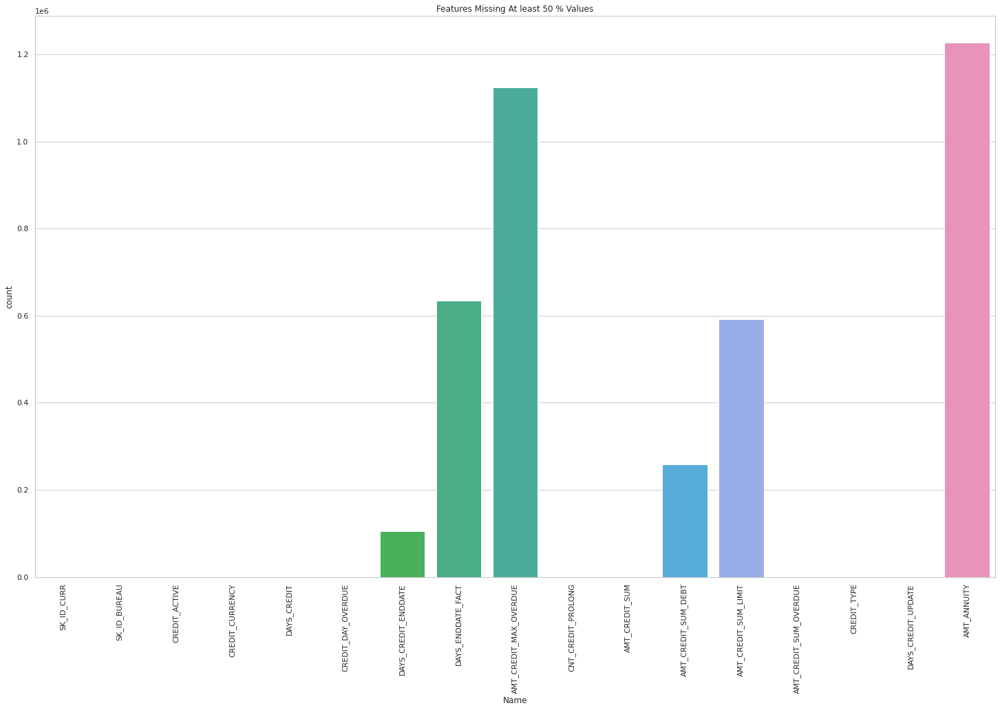

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing).set(title='Features Missing At least 50 % Values')
plt.xticks(rotation = 90)
plt.show()

**Observations**

7 features in Bureau are missing values

Categorical Feature : Credit Active and Credit type

<h4>Categorical Features : Credit Active and Credit Type </h4>
CREDIT_ACTIVE : Status of Credit Bureau Reported Credits
CREDIT_TYPE : Type of Credit Bureau Credit

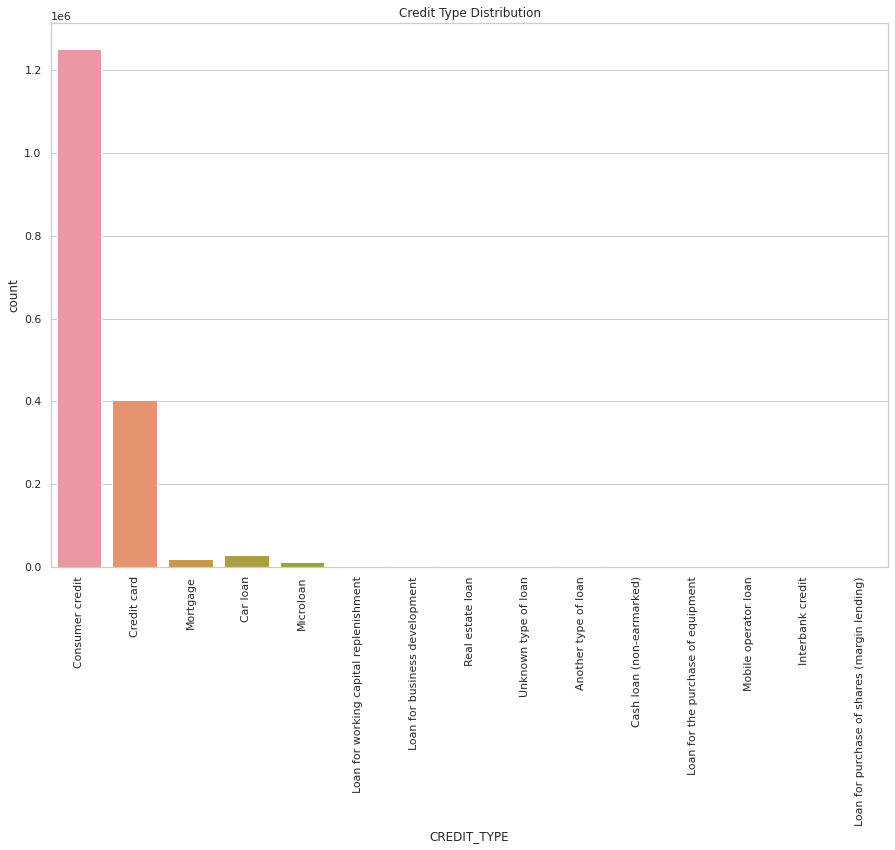

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(x='CREDIT_TYPE', data=datasets["bureau"]);
plt.title('Credit Type Distribution');
plt.xticks(rotation=90);
plt.show()

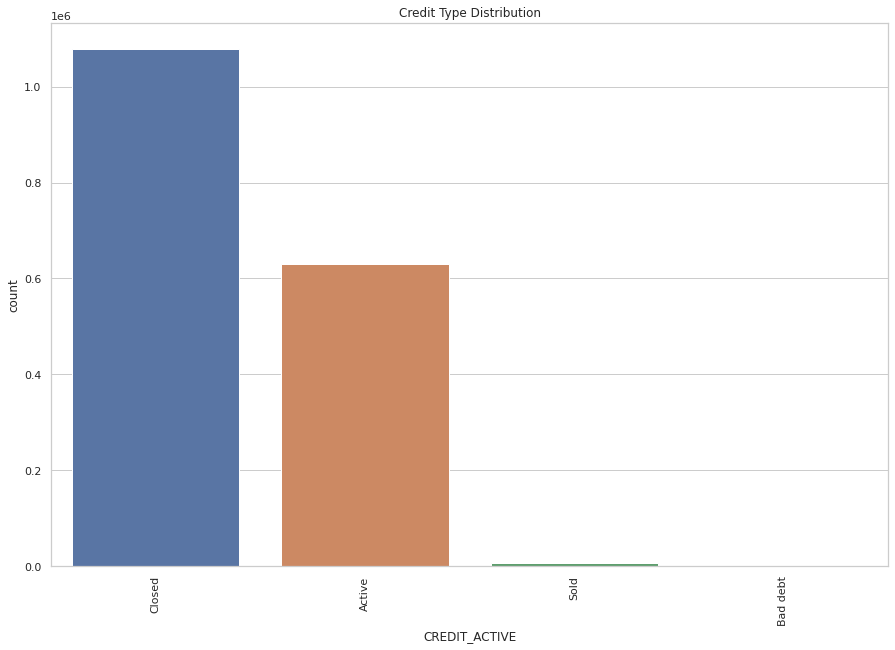

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(x='CREDIT_ACTIVE', data=datasets["bureau"]);
plt.title('Credit Type Distribution');
plt.xticks(rotation=90);
plt.show()

<h2> Previous Application File EDA </h2>

In [ ]:
datasets['previous_application'].describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1297984.0,997149.000000,997149.000000,997149.000000,997149.000000,997149.00000,997149.0
mean,1.923089e+06,2.783572e+05,1.594889e+04,1.749806e+05,1.960131e+05,6.699080e+03,2.275182e+05,1.248418e+01,9.964675e-01,0.079651,0.188599,0.774902,-8.806797e+02,3.139511e+02,NaN,340114.343750,13838.132812,33764.871094,76829.148438,82314.84375,NaN
std,5.325980e+05,1.028148e+05,1.477695e+04,2.933005e+05,3.177837e+05,2.090572e+04,3.154605e+05,3.334028e+00,5.932963e-02,0.107788,0.087708,0.100952,7.790997e+02,7.127443e+03,0.0,88611.609375,72421.296875,106544.812500,150155.109375,152926.93750,0.0
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034790,0.373047,-2.922000e+03,-1.000000e+00,0.0,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.00000,0.0
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160767,0.715820,-1.300000e+03,-1.000000e+00,6.0,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.00000,0.0
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189087,0.834961,-5.810000e+02,3.000000e+00,12.0,365243.000000,-831.000000,-361.000000,-537.000000,-499.00000,0.0
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108887,0.193359,0.852539,-2.800000e+02,8.200000e+01,24.0,365243.000000,-411.000000,129.000000,-74.000000,-44.00000,1.0
max,2.845382e+06,4.562550e+05,4.180582e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,84.0,365243.000000,365243.000000,365243.000000,365243.000000,365243.00000,1.0


In [ ]:
datasets['previous_application'].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1670214,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1670214,1.670214e+06,1670214,1.670214e+06,774370.000000,5951.000000,5951.000000,1670214,1670214,1.670214e+06,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1.670214e+06,1670214,1297984.0,1670214,1669868,997149.000000,997149.000000,997149.000000,997149.000000,997149.00000,997149.0
unique,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,7,NaN,2,NaN,NaN,NaN,NaN,25,4,NaN,4,9,7,4,28,5,3,8,NaN,11,NaN,5,17,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,Cash loans,NaN,NaN,NaN,NaN,NaN,TUESDAY,NaN,Y,NaN,NaN,NaN,NaN,XAP,Approved,NaN,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,NaN,XNA,NaN,XNA,Cash,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,747553,NaN,NaN,NaN,NaN,NaN,255118,NaN,1661739,NaN,NaN,NaN,NaN,922661,1036781,NaN,1033552,1353093,508970,1231261,950809,691011,1063666,719968,NaN,855720,NaN,517215,285990,NaN,NaN,NaN,NaN,NaN,NaN
mean,1.923089e+06,2.783572e+05,NaN,1.594889e+04,1.749806e+05,1.960131e+05,6.699080e+03,2.275182e+05,NaN,1.248418e+01,NaN,9.964675e-01,0.079651,0.188599,0.774902,NaN,NaN,-8.806797e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.139511e+02,NaN,NaN,NaN,NaN,340114.343750,13838.132812,33764.871094,76829.148438,82314.84375,NaN
std,5.325980e+05,1.028148e+05,NaN,1.477695e+04,2.933005e+05,3.177837e+05,2.090572e+04,3.154605e+05,NaN,3.334028e+00,NaN,5.932963e-02,0.107788,0.087708,0.100952,NaN,NaN,7.790997e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.127443e+03,NaN,0.0,NaN,NaN,88611.609375,72421.296875,106544.812500,150155.109375,152926.93750,0.0
min,1.000001e+06,1.000010e+05,NaN,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,NaN,0.000000e+00,NaN,0.000000e+00,-0.000015,0.034790,0.373047,NaN,NaN,-2.922000e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000e+00,NaN,0.0,NaN,NaN,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.00000,0.0
25%,1.461857e+06,1.893290e+05,NaN,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,NaN,1.000000e+01,NaN,1.000000e+00,0.000000,0.160767,0.715820,NaN,NaN,-1.300000e+03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-1.000000e+00,NaN,6.0,NaN,NaN,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.00000,0.0
50%,1.923110e+06,2.787145e+05,NaN,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,NaN,1.200000e+01,NaN,1.000000e+00,0.051605,0.189087,0.834961,NaN,NaN,-5.810000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.000000e+00,NaN,12.0,NaN,NaN,365243.000000,-831.000000,-361.000000,-537.000000,-499.00000,0.0
75%,2.384280e+06,3.675140e+05,NaN,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,NaN,1.500000e+01,NaN,1.000000e+00,0.108887,0.193359,0.852539,NaN,NaN,-2.800000e+02,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.200000e+01,NaN,24.0,NaN,NaN,365243.000000,-411.000000,129.000000,-74.000000,-44.00000,1.0


Missing Values in Previous Applications

In [ ]:
sum_missing = (datasets["previous_application"].isna().sum())
sum_missing

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 16


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

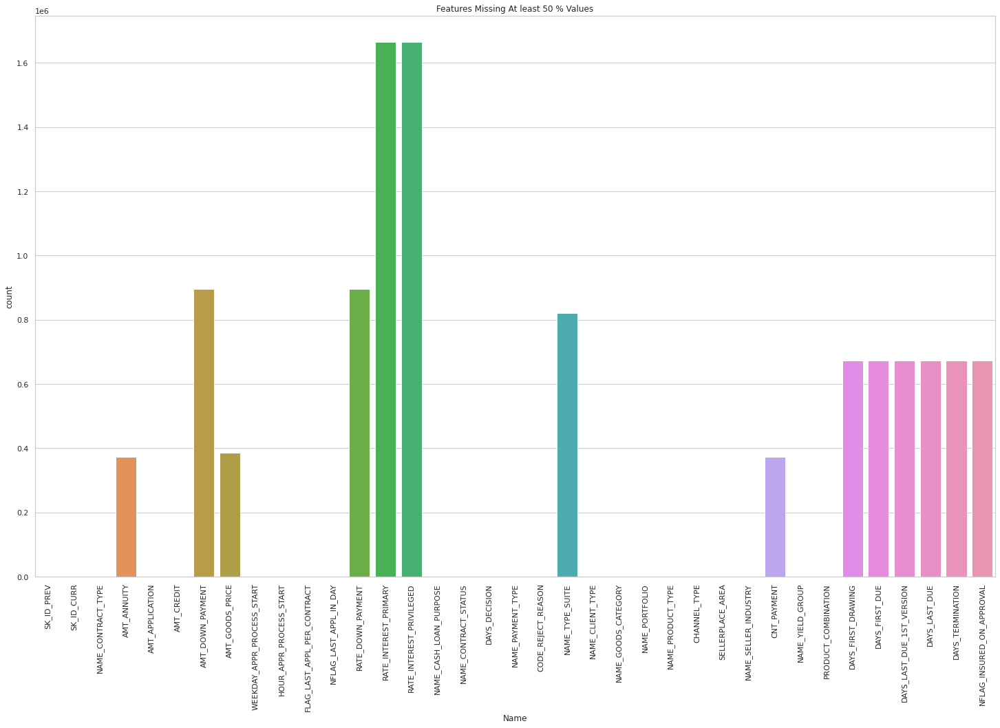

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing).set(title='Features Missing At least 50 % Values')
plt.xticks(rotation = 90)
plt.show()

<h3> EDA for Previous Application </h3>

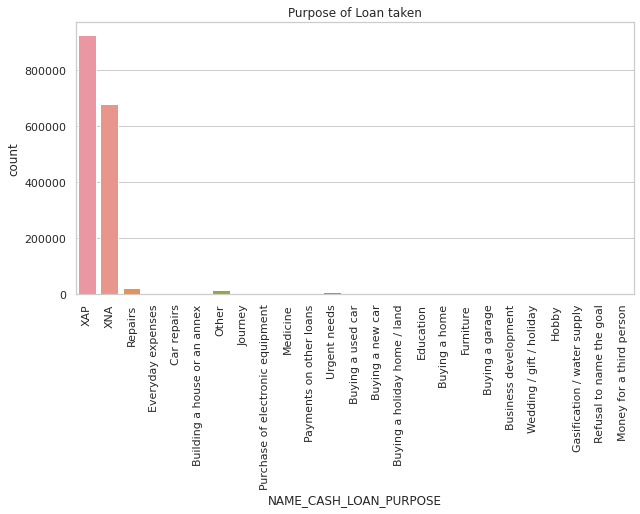

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='NAME_CASH_LOAN_PURPOSE', data=datasets["previous_application"]);
plt.title('Purpose of Loan taken');
plt.xticks(rotation=90);
plt.show()

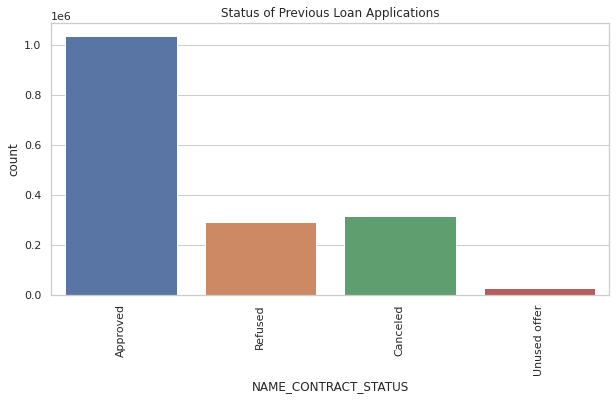

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='NAME_CONTRACT_STATUS', data=datasets["previous_application"]);
plt.title('Status of Previous Loan Applications');
plt.xticks(rotation=90);
plt.show()

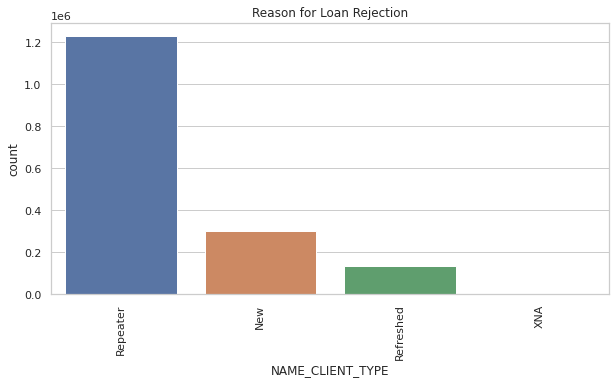

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x='NAME_CLIENT_TYPE', data=datasets["previous_application"]);
plt.title('Reason for Loan Rejection');
plt.xticks(rotation=90);
plt.show()

<h3>EDA of CREDIT CARD BALANCE </h3>

In [ ]:
datasets['credit_card_balance'].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.072324e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3090496.0,3.840312e+06,3.090496e+06,3090496.0,3535076.0,3.840312e+06,3.840312e+06
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.827686e+04,1.538080e+05,5.962299e+03,7.432263e+03,2.881647e+02,2.968840e+03,3.541778e+03,1.021103e+04,7.564767e+03,5.595036e+04,5.808502e+04,5.809459e+04,NaN,7.031439e-01,4.810333e-03,NaN,NaN,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.074641e+05,1.651457e+05,2.803397e+04,3.336682e+04,8.197021e+03,2.066321e+04,5.525350e+03,3.579142e+04,3.159429e+04,1.015177e+05,1.071769e+05,1.071802e+05,0.0,3.190347e+00,8.239746e-02,0.0,0.0,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.0,0.000000e+00,0.000000e+00,0.0,0.0,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.523700e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,4.0,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.702700e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,15.0,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,9.000000e+03,6.750000e+03,8.535924e+04,8.889949e+04,8.891451e+04,0.0,0.000000e+00,0.000000e+00,0.0,32.0,0.000000e+00,0.000000e+00
max,2.843496e+06,4.562500e+05,-1.000000e+00,1.505902e+06,1.350000e+06,2.115000e+06,2.287098e+06,1.529847e+06,2.239274e+06,2.028820e+05,4.289208e+06,4.278316e+06,1.472317e+06,1.493338e+06,1.493338e+06,51.0,1.650000e+02,1.200000e+01,165.0,120.0,3.260000e+03,3.260000e+03


In [ ]:
datasets['credit_card_balance'].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,AMT_PAYMENT_CURRENT,AMT_PAYMENT_TOTAL_CURRENT,AMT_RECEIVABLE_PRINCIPAL,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.090496e+06,3.840312e+06,3.090496e+06,3.090496e+06,3.535076e+06,3.072324e+06,3.840312e+06,3.840312e+06,3.840312e+06,3.840312e+06,3090496.0,3.840312e+06,3.090496e+06,3090496.0,3535076.0,3840312,3.840312e+06,3.840312e+06
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3698436,NaN,NaN
mean,1.904504e+06,2.783242e+05,-3.452192e+01,5.827686e+04,1.538080e+05,5.962299e+03,7.432263e+03,2.881647e+02,2.968840e+03,3.541778e+03,1.021103e+04,7.564767e+03,5.595036e+04,5.808502e+04,5.809459e+04,NaN,7.031439e-01,4.810333e-03,NaN,NaN,NaN,9.283667e+00,3.316220e-01
std,5.364695e+05,1.027045e+05,2.666775e+01,1.074641e+05,1.651457e+05,2.803397e+04,3.336682e+04,8.197021e+03,2.066321e+04,5.525350e+03,3.579142e+04,3.159429e+04,1.015177e+05,1.071769e+05,1.071802e+05,0.0,3.190347e+00,8.239746e-02,0.0,0.0,NaN,9.751570e+01,2.147923e+01
min,1.000018e+06,1.000060e+05,-9.600000e+01,-4.202502e+05,0.000000e+00,-6.827310e+03,-6.211620e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,-4.233058e+05,-4.202502e+05,-4.202502e+05,0.0,0.000000e+00,0.000000e+00,0.0,0.0,NaN,0.000000e+00,0.000000e+00
25%,1.434385e+06,1.895170e+05,-5.500000e+01,0.000000e+00,4.500000e+04,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.523700e+02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,4.0,NaN,0.000000e+00,0.000000e+00
50%,1.897122e+06,2.783960e+05,-2.800000e+01,0.000000e+00,1.125000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.702700e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.0,0.000000e+00,0.000000e+00,0.0,15.0,NaN,0.000000e+00,0.000000e+00
75%,2.369328e+06,3.675800e+05,-1.100000e+01,8.904669e+04,1.800000e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,6.633911e+03,9.000000e+03,6.750000e+03,8.535924e+04,8.889949e+04,8.891451e+04,0.0,0.000000e+00,0.000000e+00,0.0,32.0,NaN,0.000000e+00,0.000000e+00


Missing Values in Credit Card Balance

In [ ]:
sum_missing = (datasets["credit_card_balance"].isna().sum())
sum_missing

SK_ID_PREV                         0
SK_ID_CURR                         0
MONTHS_BALANCE                     0
AMT_BALANCE                        0
AMT_CREDIT_LIMIT_ACTUAL            0
AMT_DRAWINGS_ATM_CURRENT      749816
AMT_DRAWINGS_CURRENT               0
AMT_DRAWINGS_OTHER_CURRENT    749816
AMT_DRAWINGS_POS_CURRENT      749816
AMT_INST_MIN_REGULARITY       305236
AMT_PAYMENT_CURRENT           767988
AMT_PAYMENT_TOTAL_CURRENT          0
AMT_RECEIVABLE_PRINCIPAL           0
AMT_RECIVABLE                      0
AMT_TOTAL_RECEIVABLE               0
CNT_DRAWINGS_ATM_CURRENT      749816
CNT_DRAWINGS_CURRENT               0
CNT_DRAWINGS_OTHER_CURRENT    749816
CNT_DRAWINGS_POS_CURRENT      749816
CNT_INSTALMENT_MATURE_CUM     305236
NAME_CONTRACT_STATUS               0
SK_DPD                             0
SK_DPD_DEF                         0
dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 9


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

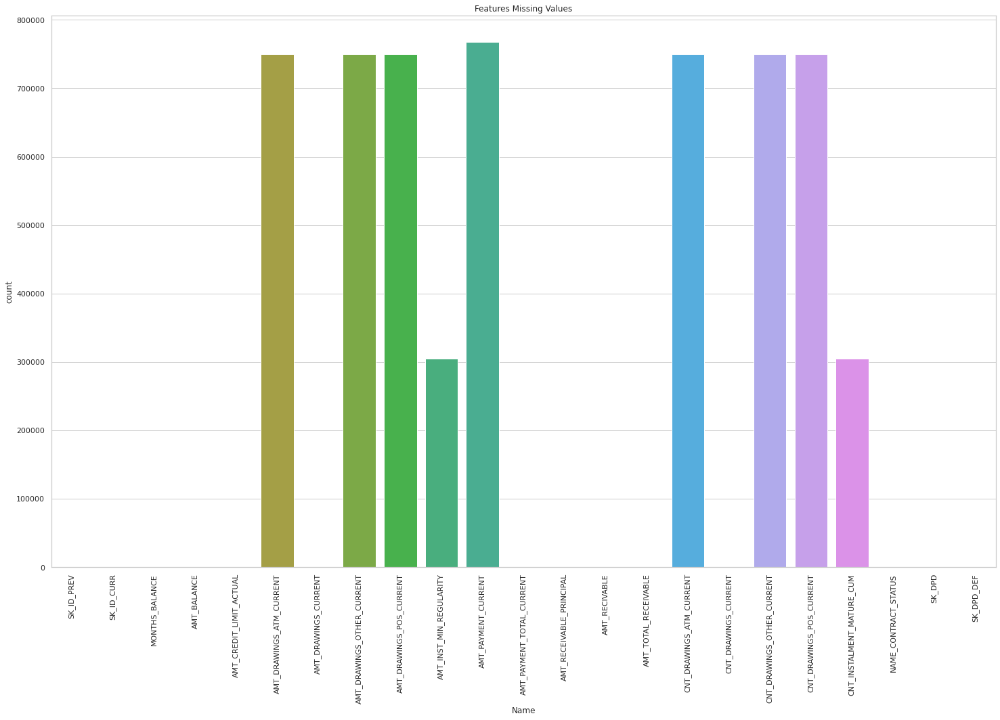

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing).set(title='Features Missing Values')
plt.xticks(rotation = 90)
plt.show()

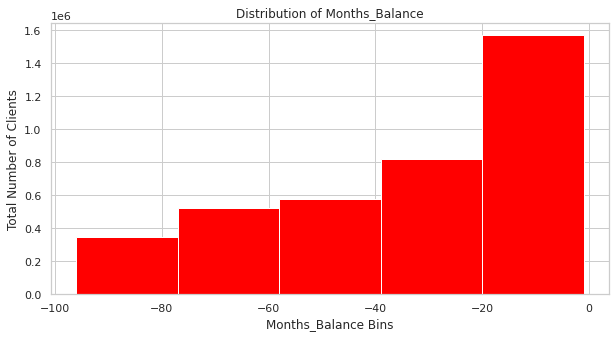

In [ ]:
plt.figure(figsize=(10,5))
plt.hist(datasets['credit_card_balance'][['MONTHS_BALANCE']].values, bins=5,color='red',label=True)
plt.title('Distribution of Months_Balance')
plt.xlabel('Months_Balance Bins')
plt.ylabel('Total Number of Clients')
plt.show()

<h2> EDA of POS_CASH_BALANCE </h2>

In [ ]:
datasets['POS_CASH_balance'].describe()

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9975287.0,9975271.0,1.000136e+07,1.000136e+07
mean,1.903217e+06,2.784039e+05,-3.501259e+01,NaN,NaN,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,0.0,0.0,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.0,0.0,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,10.0,3.0,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,12.0,7.0,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,24.0,14.0,0.000000e+00,0.000000e+00
max,2.843499e+06,4.562550e+05,-1.000000e+00,92.0,85.0,4.231000e+03,3.595000e+03


In [ ]:
datasets['POS_CASH_balance'].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
count,1.000136e+07,1.000136e+07,1.000136e+07,9975287.0,9975271.0,10001358,1.000136e+07,1.000136e+07
unique,NaN,NaN,NaN,NaN,NaN,9,NaN,NaN
top,NaN,NaN,NaN,NaN,NaN,Active,NaN,NaN
freq,NaN,NaN,NaN,NaN,NaN,9151119,NaN,NaN
mean,1.903217e+06,2.784039e+05,-3.501259e+01,NaN,NaN,NaN,1.160693e+01,6.544684e-01
std,5.358465e+05,1.027637e+05,2.606657e+01,0.0,0.0,NaN,1.327140e+02,3.276249e+01
min,1.000001e+06,1.000010e+05,-9.600000e+01,1.0,0.0,NaN,0.000000e+00,0.000000e+00
25%,1.434405e+06,1.895500e+05,-5.400000e+01,10.0,3.0,NaN,0.000000e+00,0.000000e+00
50%,1.896565e+06,2.786540e+05,-2.800000e+01,12.0,7.0,NaN,0.000000e+00,0.000000e+00
75%,2.368963e+06,3.674290e+05,-1.300000e+01,24.0,14.0,NaN,0.000000e+00,0.000000e+00


Missing Values in POS_CASH_BALANCE

In [ ]:
sum_missing = (datasets["POS_CASH_balance"].isna().sum())
sum_missing

SK_ID_PREV                   0
SK_ID_CURR                   0
MONTHS_BALANCE               0
CNT_INSTALMENT           26071
CNT_INSTALMENT_FUTURE    26087
NAME_CONTRACT_STATUS         0
SK_DPD                       0
SK_DPD_DEF                   0
dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 2


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

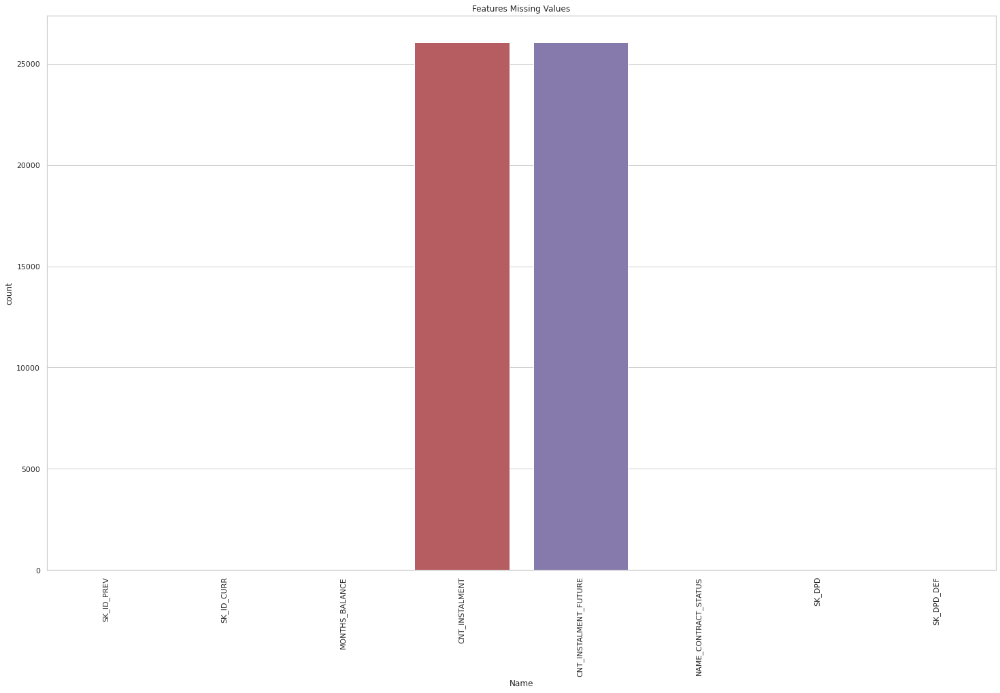

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing).set(title='Features Missing Values')
plt.xticks(rotation = 90)
plt.show()

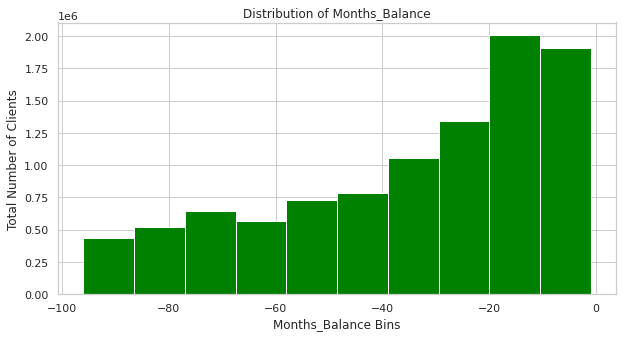

In [ ]:
plt.figure(figsize=(10,5))
plt.hist(datasets['POS_CASH_balance'][['MONTHS_BALANCE']].values, bins=10,color='green',label=True)
plt.title('Distribution of Months_Balance')
plt.xlabel('Months_Balance Bins')
plt.ylabel('Total Number of Clients')
plt.show()

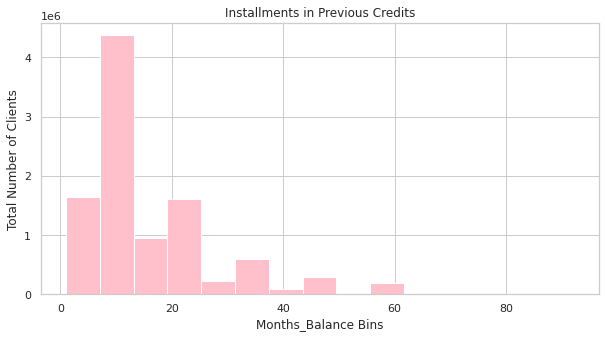

In [ ]:
plt.figure(figsize=(10,5))
plt.hist(datasets['POS_CASH_balance'][['CNT_INSTALMENT']].values, bins=15,color='pink',label=True)
plt.title('Installments in Previous Credits')
plt.xlabel('Months_Balance Bins')
plt.ylabel('Total Number of Clients')
plt.show()

<h2> EDA of Installment Payments </h2>

In [ ]:
datasets['installments_payments'].describe()

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,13605401.0,1.360540e+07,13605401.0,13602496.0,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,NaN,1.887090e+01,NaN,NaN,1.675076e+04,1.691504e+04
std,5.362029e+05,1.027183e+05,0.0,2.666407e+01,NaN,NaN,4.964295e+04,5.375981e+04
min,1.000001e+06,1.000010e+05,0.0,1.000000e+00,-2922.0,-4920.0,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.0,4.000000e+00,-1654.0,-1662.0,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.0,8.000000e+00,-818.0,-827.0,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.0,1.900000e+01,-361.0,-370.0,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,178.0,2.770000e+02,-1.0,-1.0,3.771488e+06,3.771488e+06


In [ ]:
datasets['installments_payments'].describe(include='all')

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
count,1.360540e+07,1.360540e+07,13605401.0,1.360540e+07,13605401.0,13602496.0,1.360540e+07,1.360250e+07
mean,1.903365e+06,2.784449e+05,NaN,1.887090e+01,NaN,NaN,1.675076e+04,1.691504e+04
std,5.362029e+05,1.027183e+05,0.0,2.666407e+01,NaN,NaN,4.964295e+04,5.375981e+04
min,1.000001e+06,1.000010e+05,0.0,1.000000e+00,-2922.0,-4920.0,0.000000e+00,0.000000e+00
25%,1.434191e+06,1.896390e+05,0.0,4.000000e+00,-1654.0,-1662.0,4.226085e+03,3.398265e+03
50%,1.896520e+06,2.786850e+05,1.0,8.000000e+00,-818.0,-827.0,8.884080e+03,8.125515e+03
75%,2.369094e+06,3.675300e+05,1.0,1.900000e+01,-361.0,-370.0,1.671021e+04,1.610842e+04
max,2.843499e+06,4.562550e+05,178.0,2.770000e+02,-1.0,-1.0,3.771488e+06,3.771488e+06


Missing Values in Installment Payments

In [ ]:
sum_missing = (datasets["installments_payments"].isna().sum())
sum_missing

SK_ID_PREV                   0
SK_ID_CURR                   0
NUM_INSTALMENT_VERSION       0
NUM_INSTALMENT_NUMBER        0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT        2905
AMT_INSTALMENT               0
AMT_PAYMENT               2905
dtype: int64

In [ ]:
print('Features missing values',sum_missing[sum_missing > 0].count())

Features missing values 2


In [ ]:
sum_missing = pd.DataFrame(sum_missing)
sum_missing.columns = ['count']
sum_missing.index.names = ['Name']
sum_missing['Name'] = sum_missing.index

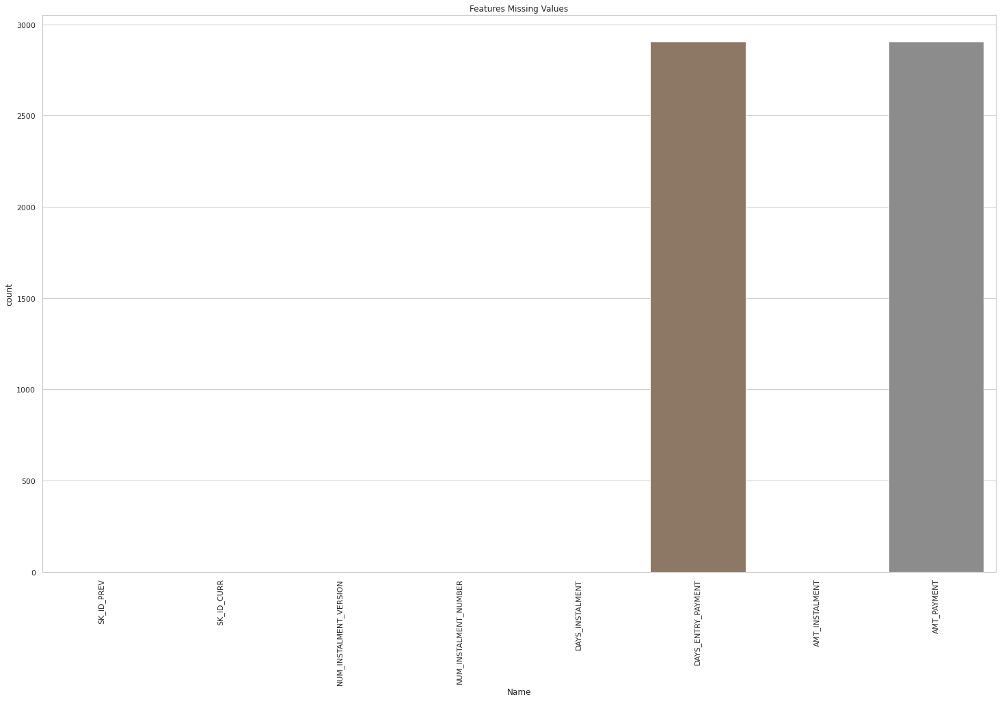

In [ ]:
sns.set(style="whitegrid", color_codes=True,rc={'figure.figsize':(25,15)})
sns.barplot(x = 'Name', y = 'count', data=sum_missing).set(title='Features Missing Values')
plt.xticks(rotation = 90)
plt.show()

<h3> Removing Null Values from  Aplication train </h3>

In [ ]:
datasets['application_train']['NAME_FAMILY_STATUS'].fillna('NA', inplace=True)
datasets['application_train']['NAME_HOUSING_TYPE'].fillna('NA', inplace=True)
datasets['application_train']['FLAG_MOBIL'].fillna('NA', inplace=True)
datasets['application_train']['FLAG_EMP_PHONE'].fillna('NA', inplace=True)
datasets['application_train']['FLAG_CONT_MOBILE'].fillna('NA', inplace=True)
datasets['application_train']['FLAG_EMAIL'].fillna('NA', inplace=True)
datasets['application_train']['OCCUPATION_TYPE'].fillna('NA', inplace=True)
datasets['application_train']['CNT_FAM_MEMBERS'].fillna(0,inplace=True)
#Days Employed value for 1 row has been filled in wrong.         
datasets['application_train'].replace(max(datasets['application_train']['DAYS_EMPLOYED'].values), np.nan, inplace=True)
datasets['application_train']['CODE_GENDER'].replace('XNA','M',inplace=True)
#There are a total of 4 applicants with Gender provided as 'XNA'
datasets['application_train']['AMT_ANNUITY'].fillna(0, inplace=True)
#A total of 36 datasets['application_train']points are there where Annuity Amount is null.
datasets['application_train']['AMT_GOODS_PRICE'].fillna(0, inplace=True)
#A total of 278 datasets['application_train']points are there where Annuity Amount is null.
datasets['application_train']['NAME_TYPE_SUITE'].fillna('NA', inplace=True)
datasets['application_train']['OCCUPATION_TYPE'].fillna('NA', inplace=True)
datasets['application_train']['EXT_SOURCE_1'].fillna(0, inplace=True)
datasets['application_train']['EXT_SOURCE_2'].fillna(0, inplace=True)
datasets['application_train']['EXT_SOURCE_3'].fillna(0, inplace=True)
datasets['previous_application']['DAYS_TERMINATION'].replace(max(datasets['previous_application']['DAYS_TERMINATION'].values),np.nan, inplace=True)
datasets['application_train']= datasets['application_train'].drop(['FLAG_DOCUMENT_2','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7',
    'FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13',
    'FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19',
    'FLAG_DOCUMENT_20','FLAG_DOCUMENT_21'],axis=1)

<h2> Feature Aggregation Class for Aggregation using Pipeline  </h2>

In [ ]:
class FeatureAggregator(BaseEstimator,TransformerMixin):
  def __init__(self,dataset,features):
    self.features=features
    self.dataset=dataset
    self.agg_ops=['min','max','mean','sum']
  
  def fit(self,X,y=None):
    return self
  
  def transform(self,X,y=None):
    result=X.groupby(['SK_ID_CURR']).agg(self.agg_ops)
    result.columns=["_".join(x) for x in result.columns.ravel()]
    result=result.reset_index(level=["SK_ID_CURR"])
    return result

<h3> Merging Previous Application Dataset with Application Train|Test </h3>

<h3> Feature Engineering of Previous Application </h3>
1) pa_APPLICATION_CREDIT_DIFF= Difference of how much client asked on the previous application and final credit<br/> 
2) pa_APPLICATION_CREDIT_RATIO = Ratio of how much client asked on the previous application and final credit<br/> 
3) pa_CREDIT_TO_ANNUITY_RATIO = Ratio of credit amount and annuity amount of the previous applications<br/>
4) pa_DOWN_PAYMENT_TO_CREDIT = Down payment as a percentage of total credit of previous application<br/>

In [ ]:
prev_df=datasets['previous_application']
prev_df=ohe(prev_df)

In [ ]:
prev_app_features=['AMT_ANNUITY','AMT_APPLICATION','AMT_CREDIT','AMT_DOWN_PAYMENT','AMT_GOODS_PRICE','CNT_PAYMENT','DAYS_DECISION','HOUR_APPR_PROCESS_START','RATE_DOWN_PAYMENT']
prev_df=prev_df.groupby(["SK_ID_CURR"],as_index=False).agg('mean')
prev_app_pipeline=Pipeline([
("prev_app_aggregator",FeatureAggregator(prev_df,prev_app_features))
])

In [ ]:
prev_app_agg=prev_app_pipeline.transform(prev_df)
prev_df=prev_df.merge(prev_app_agg,how='left',on=['SK_ID_CURR'])
rename(prev_df,"pa")

In [ ]:
prev_df['pa_APPLICATION_CREDIT_DIFF'] = prev_df['pa_AMT_APPLICATION'] - prev_df['pa_AMT_CREDIT']
prev_df['pa_APPLICATION_CREDIT_RATIO'] = prev_df['pa_AMT_APPLICATION'] / prev_df['pa_AMT_CREDIT']
prev_df['pa_CREDIT_TO_ANNUITY_RATIO'] = prev_df['pa_AMT_CREDIT']/prev_df['pa_AMT_ANNUITY']
prev_df['pa_DOWN_PAYMENT_TO_CREDIT'] = prev_df['pa_AMT_DOWN_PAYMENT'] / prev_df['pa_AMT_CREDIT']

In [ ]:
prev_df.shape

(338857, 820)

In [ ]:
prev_df['SK_ID_CURR'].nunique()

338857

In [ ]:
del prev_app_agg
gc.collect()

290

<h3> Merging Credit Card Balance Dataset with Application Train|Test </h3>

<h3> Feature Engineering of Credit card balance </h3>
1) cc_LIMIT_USE = total used credit as a percentage of total limit<br/>
2) cc_PAYMENT_DIV_MIN = Ratio of credit payment of the month and minimum installment for the month<br/>
3) cc_LATE_PAYMENT = Late payment flag for the month<br/>
4) cc_DRAWING_LIMIT_RATIO = Ratio of total drawings of the month with credit limit amount<br/>

In [ ]:
cc_df=datasets['credit_card_balance']
cc_df=ohe(cc_df)

In [ ]:
cc_features=["MONTHS_BALANCE","AMT_BALANCE","CNT_INSTALMENT_MATURE_CUM"]
cc_df=cc_df.groupby(["SK_ID_CURR"],as_index=False).agg("mean")
cc_bal_pipeline=Pipeline([
                 ("cc_aggregator",FeatureAggregator(cc_df,cc_features))
])

In [ ]:
cc_bal_agg=cc_bal_pipeline.transform(cc_df)
cc_df=cc_df.merge(cc_bal_agg,how='left',on=['SK_ID_CURR'])
rename(cc_df,"cc")

In [ ]:
cc_df['cc_LIMIT_USE'] = cc_df['cc_AMT_BALANCE'] / cc_df['cc_AMT_CREDIT_LIMIT_ACTUAL']
cc_df['cc_PAYMENT_DIV_MIN'] = cc_df['cc_AMT_PAYMENT_CURRENT'] / cc_df['cc_AMT_INST_MIN_REGULARITY']
cc_df['cc_LATE_PAYMENT'] = cc_df['cc_SK_DPD'].apply(lambda x: 1 if x > 0 else 0)    
cc_df['cc_DRAWING_LIMIT_RATIO'] = cc_df['cc_AMT_DRAWINGS_ATM_CURRENT'] / cc_df['cc_AMT_CREDIT_LIMIT_ACTUAL']

In [ ]:
cc_df.shape

(103558, 145)

In [ ]:
cc_df['SK_ID_CURR'].nunique()

In [ ]:
del cc_bal_agg
gc.collect()

248

<h3> Merging POS_CASH_Balance Dataset with Application Train|Test </h3>

In [ ]:
pos_df=datasets['POS_CASH_balance']
pos_df=ohe(pos_df)

In [ ]:
pos_features=['SK_DPD_DEF','SK_DPD','MONTHS_BALANCE','CNT_INSTALMENT','CNT_INSTALMENT_FUTURE']
pos_df=pos_df.groupby(["SK_ID_CURR"],as_index=False).agg("mean")
pos_cash_pipeline=Pipeline([
                 ("pos_cash_aggregator",FeatureAggregator(pos_df,pos_features))
])

In [ ]:
pos_cash_agg=pos_cash_pipeline.transform(pos_df)
pos_df=pos_df.merge(pos_cash_agg,how='left',on=['SK_ID_CURR'])
rename(pos_df,"pos")

In [ ]:
pos_df['pos_LATE_PAYMENT'] = pos_df['pos_SK_DPD'].apply(lambda x:1 if x>0 else 0)

In [ ]:
pos_df.shape

In [ ]:
pos_df['SK_ID_CURR'].nunique()

337252

In [ ]:
del pos_cash_agg
gc.collect()

380

INSTALLMENT_PAYMENTS Pipeline

<h3> Feature Engineering of Installment Payment </h3>

1) ins_PAID_OVER_AMOUNT = Excess amount paid over prescribed installment amount
<br/>
2) ins_DBD = The difference between the actual Insatllment payment and scheduled payment date<br/>
3) ins_LATE_PAYMENT = Late installment payment flag<br/>
3) ins_INSTALMENT_PAYMENT_RATIO =ratio of actual installment payment and prescribed installment amount<br/>
4) ins_LATE_PAYMENT_RATIO = Installment payment ratio of late payments<br/>
5) ins_SIGNIFICANT_LATE_PAYMENT = Installment payment ratio of late payments where payments for late payments more than 5% of the time<br/>


In [ ]:
ins_df=datasets['installments_payments']
ins_df=ohe(ins_df)

In [ ]:
ins_features=['AMT_INSTALMENT','DAYS_ENTRY_PAYMENT','AMT_PAYMENT']
ins_df=ins_df.groupby(["SK_ID_CURR"],as_index=False).agg("mean")
ins_pay_pipeline=Pipeline([
                           ("ins_pay_aggregator",FeatureAggregator(ins_df,ins_features))
])

In [ ]:
ins_pay_agg=ins_pay_pipeline.transform(ins_df)
ins_df=ins_df.merge(ins_pay_agg,how='left',on=['SK_ID_CURR'])
rename(ins_df,"ins")

In [ ]:
ins_df['ins_PAID_OVER_AMOUNT'] = ins_df['ins_AMT_PAYMENT'] - ins_df['ins_AMT_INSTALMENT']
ins_df['ins_DBD'] = ins_df['ins_DAYS_INSTALMENT'] - ins_df['ins_DAYS_ENTRY_PAYMENT']
ins_df['ins_DBD'] = ins_df['ins_DBD'].apply(lambda x: 0 if x <= 0 else x)
ins_df['ins_LATE_PAYMENT'] = ins_df['ins_DBD'].apply(lambda x: 1 if x > 0 else 0)
ins_df['ins_INSTALMENT_PAYMENT_RATIO'] = ins_df['ins_AMT_PAYMENT'] / ins_df['ins_AMT_INSTALMENT']
ins_df['ins_LATE_PAYMENT_RATIO'] = ins_df.apply(lambda x: x['ins_INSTALMENT_PAYMENT_RATIO'] if x['ins_LATE_PAYMENT'] == 1 else 0, axis=1)
ins_df['ins_SIGNIFICANT_LATE_PAYMENT'] = ins_df['ins_LATE_PAYMENT_RATIO'].apply(lambda x: 1 if x > 0.05 else 0)

In [ ]:
ins_df.shape

In [ ]:
del ins_pay_agg
gc.collect()

88

<h3> Bureau and Bureau Balance </h3>

<h3> FEATURE ENGINEERING of Bureau </h3>

<h4>Features Added from Bureau </h4>
1) bur_CREDIT_DURATION = The difference between the days before the current application when client applied for Credit Bureau credit and the remaining duration of CB Credit in days
<br/>
2) bur_ENDDATE_DIFF = The difference between the actual closed credit in Credit Bureau and remaining duration of credit in days<br/>
3) but_UPDATE_DIFF = Difference between the credit end date and last update date<br/>
3) bur_DEBT_PERCENTAGE =Total debt as a percentage of credit<br/>
4) DEBT_CREDIT_DIFF = Difference in total credit and total debt<br/>
5) CREDIT_TO_ANNUITY_RATIO = ratio of total credit to Annuity<br/>
6) DEBT_TO_ANNUITY_RATIO  = ratio of total debt to Annuity<br/>
7) CREDIT_OVERDUE_DIFF = Difference in total credit and Overdue amount<br/>
8) appcount = total count of previous loans in bureau history<br/>

In [ ]:
bur_df=datasets['bureau']
bur_df=ohe(bur_df)
bur_df2=bur_df[['SK_ID_CURR']]
bur_df2['appcount']=1
bur_df2=bur_df2.groupby(['SK_ID_CURR'],as_index=False).agg("sum")
bur_features=["AMT_ANNUITY","AMT_CREDIT_SUM","AMT_CREDIT_SUM_DEBT","AMT_CREDIT_SUM_OVERDUE","AMT_CREDIT_SUM_LIMIT","CNT_CREDIT_PROLONG","DAYS_CREDIT_UPDATE","DAYS_CREDIT_ENDDATE","CREDIT_DAY_OVERDUE","AMT_CREDIT_MAX_OVERDUE","DAYS_CREDIT"]
bur_df=bur_df.groupby(["SK_ID_CURR"],as_index=False).agg("mean")

bur_pipeline=Pipeline([
                       ('bur_aggregator',FeatureAggregator(bur_df,bur_features))
                       ])

In [ ]:
bur_agg=bur_pipeline.transform(bur_df)
bur_df=bur_df.merge(bur_agg,how='left',on='SK_ID_CURR')
rename(bur_df,"bur")

In [ ]:
bur_df=bur_df.merge(bur_df2,how="left",on="SK_ID_CURR")

In [ ]:
bur_df['bur_CREDIT_DURATION'] = -bur_df['bur_DAYS_CREDIT'] + bur_df['bur_DAYS_CREDIT_ENDDATE'] 
bur_df['bur_ENDDATE_DIFF'] = bur_df['bur_DAYS_CREDIT_ENDDATE'] - bur_df['bur_DAYS_ENDDATE_FACT']
bur_df['bur_UPDATE_DIFF'] = bur_df['bur_DAYS_CREDIT_ENDDATE'] - bur_df['bur_DAYS_CREDIT_UPDATE']
bur_df['bur_DEBT_PERCENTAGE'] = bur_df['bur_AMT_CREDIT_SUM'] / bur_df['bur_AMT_CREDIT_SUM_DEBT']
bur_df['bur_DEBT_CREDIT_DIFF'] = bur_df['bur_AMT_CREDIT_SUM'] - bur_df['bur_AMT_CREDIT_SUM_DEBT']
bur_df['bur_CREDIT_TO_ANNUITY_RATIO'] = bur_df['bur_AMT_CREDIT_SUM'] / bur_df['bur_AMT_ANNUITY']
bur_df['bur_DEBT_TO_ANNUITY_RATIO'] = bur_df['bur_AMT_CREDIT_SUM_DEBT'] / bur_df['bur_AMT_ANNUITY']
bur_df['bur_CREDIT_OVERDUE_DIFF'] = bur_df['bur_AMT_CREDIT_SUM'] - bur_df['bur_AMT_CREDIT_SUM_OVERDUE']

In [ ]:
bur_df.shape

(305811, 190)

In [ ]:
del bur_agg,bur_df2
gc.collect()

387

In [ ]:
bur_bal_df=datasets['bureau_balance']
bur_bal_df=ohe(bur_bal_df)
bur_bal_features=["MONTHS_BALANCE"]
bur_bal_df=bur_bal_df.groupby(["SK_ID_BUREAU"],as_index=False).agg("mean")
bur_bal_df=bur_bal_df.groupby(["SK_ID_BUREAU"],as_index=False).agg({f"{feature}":["min","max","mean","sum"] for feature in ["MONTHS_BALANCE"]})
bur_bal_df.columns=["_".join(x) for x in bur_bal_df.columns.ravel()]
bur_bal_df.columns=pd.Index(['bur_bal_'+col for col in list(bur_bal_df.columns)])


In [ ]:
bur_bal_df.rename(columns={"bur_bal_SK_ID_BUREAU_":"SK_ID_BUREAU"},inplace=True)

In [ ]:
bur_bal_df.rename(columns={"SK_ID_BUREAU":"SK_ID_CURR"},inplace=True)

In [ ]:
bur_df.shape

In [ ]:
bur_bal_df.columns

In [ ]:
bur_df=bur_df.merge(bur_bal_df,how='left',on='SK_ID_CURR')

In [ ]:
bur_df.shape
del bur_bal_df
gc.collect()

689

<h2> Joining all the Secondary Tables with Primary Tables : Application Train/ Test </h2>

In [ ]:
app_df=datasets['application_train']

In [ ]:
app_test_df=datasets['application_test']

In [ ]:
del datasets
gc.collect()

307

In [ ]:
app_df=app_df.merge(bur_df,how='left',on='SK_ID_CURR')
app_test_df=app_test_df.merge(bur_df,how='left',on='SK_ID_CURR')
del bur_df
gc.collect()

0

In [ ]:
app_df=app_df.merge(prev_df,how='left',on='SK_ID_CURR')
app_test_df=app_test_df.merge(prev_df,how='left',on='SK_ID_CURR')
del prev_df
gc.collect()


0

In [ ]:
app_df=app_df.merge(cc_df,how='left',on='SK_ID_CURR')
app_test_df=app_test_df.merge(cc_df,how='left',on='SK_ID_CURR')
del cc_df
gc.collect()

0

In [ ]:
%%time
app_test_df=reduce_memory(app_test_df)
app_df=reduce_memory(app_df)

Memory Usage of DataFrame is 402.2889862060547
Memory Usage of DataFrame After Optimization is 139.45770263671875
Memory Usage of DataFrame is 2534.985622406006
Memory Usage of DataFrame After Optimization is 873.930721282959
CPU times: user 2min 38s, sys: 8.76 s, total: 2min 47s
Wall time: 2min 46s


In [ ]:
app_df=app_df.merge(ins_df,how='left',on="SK_ID_CURR")
app_test_df=app_test_df.merge(ins_df,how='left',on='SK_ID_CURR')
del ins_df
gc.collect()

0

In [ ]:
app_df=app_df.merge(pos_df,how='left',on='SK_ID_CURR')
app_test_df=app_test_df.merge(pos_df,how='left',on='SK_ID_CURR')
del pos_df
gc.collect()

0

In [ ]:
%%time
app_test_df=reduce_memory(app_test_df)
app_df=reduce_memory(app_df)

In [ ]:
app_df['CREDIT_INCOME_PERCENT']=app_df['AMT_CREDIT']/app_df['AMT_INCOME_TOTAL']
app_df['CREDIT_ANNUITY_PERCENT']=app_df['AMT_CREDIT']/app_df['AMT_ANNUITY']
app_df['FAMILY_INCOME_PERCENT']=app_df['AMT_INCOME_TOTAL']/app_df['CNT_FAM_MEMBERS']
app_df['CREDIT_PERIOD']=app_df['AMT_ANNUITY']/app_df['AMT_CREDIT']
app_df['EMPLOYED_PERCENT']=app_df['CREDIT_PERIOD']/app_df['DAYS_EMPLOYED']
#ADD MORE FEATURES IF REQUIRED

Join with Application test

In [ ]:
import pickle
  
# Create a variable
# myvar = [{'This': 'is', 'Example': 2}, 'of',
#          'serialisation', ['using', 'pickle']]
  
# Open a file and use dump()

with open('app_df.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(app_df, file)


In [ ]:
with open('app_test_df.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(app_test_df, file)

In [ ]:
print(list(set(app_test_df.columns)-set(app_df.columns)))

In [ ]:
%%time
temp=app_df[["TARGET"]]
correlations=np.abs(app_df.corr()['TARGET'])

In [ ]:
engg_features=['pa_APPLICATION_CREDIT_DIFF','pa_APPLICATION_CREDIT_RATIO','pa_CREDIT_TO_ANNUITY_RATIO','pa_DOWN_PAYMENT_TO_CREDIT','cc_LIMIT_USE','cc_PAYMENT_DIV_MIN','cc_LATE_PAYMENT','cc_DRAWING_LIMIT_RATIO','pos_LATE_PAYMENT','ins_PAID_OVER_AMOUNT','ins_DBD','ins_LATE_PAYMENT','ins_INSTALMENT_PAYMENT_RATIO','ins_LATE_PAYMENT_RATIO','ins_SIGNIFICANT_LATE_PAYMENT','bur_CREDIT_DURATION','bur_ENDDATE_DIFF','bur_UPDATE_DIFF','bur_DEBT_PERCENTAGE','bur_DEBT_CREDIT_DIFF','bur_CREDIT_TO_ANNUITY_RATIO','bur_DEBT_TO_ANNUITY_RATIO','bur_CREDIT_OVERDUE_DIFF','appcount']

In [ ]:
catvars=list(app_df.loc[:, ~app_df.columns.isin(engg_features)].select_dtypes(include="object").columns.values)


In [ ]:
catvars.shape

(16,)

In [ ]:
numvars=list(app_df.loc[:, ~app_df.columns.isin(engg_features)]._get_numeric_data().columns)
numvars.shape


(1342,)

In [ ]:

corr_num=np.abs(app_df.loc[:, app_df.columns.isin(numvars)].corr()['TARGET']).sort_values(ascending=False)


In [ ]:
corr_engg=np.abs(app_df.loc[:, app_df.columns.isin(engg_features+['TARGET'])].corr()['TARGET']).sort_values(ascending=False)


In [ ]:

trainer_data=pd.read_pickle("app_df_final.pkl")
print(trainer_data.shape)
# sk_id_full=trainer_data['SK_ID_CURR']
# trainer_data=trainer_data[numvar_top50+catvars+engg_features]
# trainer_data=data_prep_pipeline.fit_transform(trainer_data)
# trainer_data2=torch.FloatTensor(trainer_data).to(device=device)
corr_engg=np.abs(trainer_data.loc[:, trainer_data.columns.isin(engg_features+['TARGET'])].corr()['TARGET']).sort_values(ascending=False)


(307511, 91)


## Correlations of Engineered features with Target variable

In [ ]:
corr_engg

TARGET                          1.000000
cc_LIMIT_USE                    0.135499
cc_DRAWING_LIMIT_RATIO          0.064242
ins_INSTALMENT_PAYMENT_RATIO    0.052387
ins_LATE_PAYMENT_RATIO          0.045081
bur_UPDATE_DIFF                 0.038745
pos_LATE_PAYMENT                0.033413
bur_ENDDATE_DIFF                0.033218
bur_CREDIT_DURATION             0.032784
ins_PAID_OVER_AMOUNT            0.029257
pa_APPLICATION_CREDIT_RATIO     0.027238
bur_DEBT_CREDIT_DIFF            0.024551
pa_DOWN_PAYMENT_TO_CREDIT       0.021463
ins_DBD                         0.021389
ins_LATE_PAYMENT                0.020835
ins_SIGNIFICANT_LATE_PAYMENT    0.020835
bur_CREDIT_OVERDUE_DIFF         0.019999
pa_APPLICATION_CREDIT_DIFF      0.018064
cc_LATE_PAYMENT                 0.008116
pa_CREDIT_TO_ANNUITY_RATIO      0.007969
appcount                        0.004057
bur_DEBT_PERCENTAGE             0.004053
cc_PAYMENT_DIV_MIN              0.003876
bur_CREDIT_TO_ANNUITY_RATIO     0.002088
bur_DEBT_TO_ANNU

## Correlations of top50 Numeric features with Target variable

In [ ]:
corr_num=np.abs(trainer_data.loc[:, trainer_data.columns.isin(numvar_top50+['TARGET'])].corr()['TARGET']).sort_values(ascending=False)
corr_num

TARGET                                  1.000000
EXT_SOURCE_3                            0.178918
EXT_SOURCE_2                            0.160471
cc_CNT_DRAWINGS_ATM_CURRENT_sum         0.115947
cc_CNT_DRAWINGS_ATM_CURRENT_mean        0.107691
cc_CNT_DRAWINGS_ATM_CURRENT             0.107691
cc_CNT_DRAWINGS_ATM_CURRENT_max         0.107691
cc_CNT_DRAWINGS_ATM_CURRENT_min         0.107691
bur_DAYS_CREDIT_min                     0.089728
bur_DAYS_CREDIT_sum                     0.089728
bur_DAYS_CREDIT_max                     0.089728
bur_DAYS_CREDIT_mean                    0.089728
bur_DAYS_CREDIT                         0.089728
cc_AMT_BALANCE_sum                      0.087177
cc_AMT_BALANCE_mean                     0.087177
cc_AMT_BALANCE                          0.087177
cc_AMT_BALANCE_min                      0.087177
cc_AMT_BALANCE_max                      0.087177
cc_AMT_TOTAL_RECEIVABLE_mean            0.086490
cc_AMT_TOTAL_RECEIVABLE_min             0.086490
cc_AMT_TOTAL_RECEIVA

In [ ]:
numvar_top50=list(corr_num.index[1:51])

In [ ]:
# app_df.loc[app_df == 'NA']=np.NaN
# app_df['EXT_SOURCE_1'].unique()
datasets={}
ds_name='application_train'
datasets[ds_name] = load_data(os.path.join(DATA_DIR, f'{ds_name}.csv'), ds_name)
datasets['application_train'][['NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_CONT_MOBILE','FLAG_EMAIL','OCCUPATION_TYPE','CNT_FAM_MEMBERS','CODE_GENDER','AMT_ANNUITY','AMT_GOODS_PRICE','NAME_TYPE_SUITE','OCCUPATION_TYPE','EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3']]



Memory Usage of DataFrame is 286.2270965576172
Memory Usage of DataFrame After Optimization is 92.37870502471924
application_train: shape is (307511, 122)


In [ ]:
app_df.shape
catvars.pop()

'TARGET'

In [ ]:
app_df['NAME_FAMILY_STATUS']=datasets['application_train']['NAME_FAMILY_STATUS']
app_df['NAME_HOUSING_TYPE']=datasets['application_train']['NAME_HOUSING_TYPE']
app_df['FLAG_MOBIL']=datasets['application_train']['FLAG_MOBIL']
app_df['FLAG_EMP_PHONE']=datasets['application_train']['FLAG_EMP_PHONE']
app_df['FLAG_CONT_MOBILE']=datasets['application_train']['FLAG_CONT_MOBILE']
app_df['FLAG_EMAIL']=datasets['application_train']['FLAG_EMAIL']
app_df['OCCUPATION_TYPE']=datasets['application_train']['OCCUPATION_TYPE']
app_df['CNT_FAM_MEMBERS']=datasets['application_train']['CNT_FAM_MEMBERS']
app_df['CODE_GENDER']=datasets['application_train']['CODE_GENDER']
app_df['AMT_ANNUITY']=datasets['application_train']['AMT_ANNUITY']
app_df['AMT_GOODS_PRICE']=datasets['application_train']['AMT_GOODS_PRICE']
app_df['NAME_TYPE_SUITE']=datasets['application_train']['NAME_TYPE_SUITE']
app_df['OCCUPATION_TYPE']=datasets['application_train']['OCCUPATION_TYPE']
app_df['EXT_SOURCE_1']=datasets['application_train']['EXT_SOURCE_1']
app_df['EXT_SOURCE_2']=datasets['application_train']['EXT_SOURCE_2']
app_df['EXT_SOURCE_3']=datasets['application_train']['EXT_SOURCE_3']


In [ ]:
print(numvar_top50)
print(catvars)
print(engg_features)

['EXT_SOURCE_2', 'EXT_SOURCE_3', 'cc_CNT_DRAWINGS_ATM_CURRENT_sum', 'cc_CNT_DRAWINGS_ATM_CURRENT_mean', 'cc_CNT_DRAWINGS_ATM_CURRENT', 'cc_CNT_DRAWINGS_ATM_CURRENT_max', 'cc_CNT_DRAWINGS_ATM_CURRENT_min', 'bur_DAYS_CREDIT', 'bur_DAYS_CREDIT_sum', 'bur_DAYS_CREDIT_max', 'bur_DAYS_CREDIT_mean', 'bur_DAYS_CREDIT_min', 'cc_AMT_BALANCE_sum', 'cc_AMT_BALANCE_mean', 'cc_AMT_BALANCE', 'cc_AMT_BALANCE_min', 'cc_AMT_BALANCE_max', 'cc_AMT_TOTAL_RECEIVABLE_max', 'cc_AMT_TOTAL_RECEIVABLE_sum', 'cc_AMT_TOTAL_RECEIVABLE', 'cc_AMT_TOTAL_RECEIVABLE_mean', 'cc_AMT_TOTAL_RECEIVABLE_min', 'cc_AMT_RECIVABLE_max', 'cc_AMT_RECIVABLE_min', 'cc_AMT_RECIVABLE', 'cc_AMT_RECIVABLE_mean', 'cc_AMT_RECIVABLE_sum', 'cc_AMT_RECEIVABLE_PRINCIPAL_sum', 'cc_AMT_RECEIVABLE_PRINCIPAL_max', 'cc_AMT_RECEIVABLE_PRINCIPAL_min', 'cc_AMT_RECEIVABLE_PRINCIPAL_mean', 'cc_AMT_RECEIVABLE_PRINCIPAL', 'cc_CNT_DRAWINGS_CURRENT_max', 'cc_CNT_DRAWINGS_CURRENT', 'cc_CNT_DRAWINGS_CURRENT_min', 'cc_CNT_DRAWINGS_CURRENT_sum', 'cc_CNT_DRAWING

In [ ]:
app_df['CNT_FAM_MEMBERS'].unique()

array([ 1.,  2.,  3.,  4.,  5.,  6.,  9.,  7.,  8., 10., 13., nan, 14.,
       12., 20., 15., 16., 11.], dtype=float16)

In [ ]:
with open('app_df.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(app_df, file)

In [ ]:
app_df_final=app_df[numvar_top50+['TARGET']+catvars+engg_features]

In [ ]:
with open('app_df_final.pkl', 'wb') as file:
    # A new file will be created
    pickle.dump(app_df_final, file)

In [ ]:
# X_train, X_valid, y_train, y_valid = train_test_split(X_train, y_train, test_size=0.15, random_state=42)
y=app_df_final['TARGET']
X=app_df_final.drop(['TARGET'],axis=1)
print(X.shape,app_df_final.shape)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

(307511, 90) (307511, 91)


In [ ]:
X_train.shape

(246008, 90)

In [ ]:
del app_df_final
gc.collect()

819

# Pipleine

###  OHE when previously unseen unique values in the test/validation set

Train, validation and Test sets (and the leakage problem we have mentioned previously):

 

Let's look at a small usecase to tell us how to deal with this:

* The OneHotEncoder is fitted to the training set, which means that for each unique value present in the training set, for each feature, a new column is created. Let's say we have 39 columns after the encoding up from 30 (before preprocessing).
* The output is a numpy array (when the option sparse=False is used), which has the disadvantage of losing all the information about the original column names and values.
* When we try to transform the test set, after having fitted the encoder to the training set, we obtain a `ValueError`. This is because the there are new, previously unseen unique values in the test set and the encoder doesn’t know how to handle these values. In order to use both the transformed training and test sets in machine learning algorithms, we need them to have the same number of columns.

This last problem can be solved by using the option handle_unknown='ignore'of the OneHotEncoder, which, as the name suggests, will ignore previously unseen values when transforming the test set.

 

Here is a example that in action:

```python
# Identify the categorical features we wish to consider.
cat_attribs = ['CODE_GENDER', 'FLAG_OWN_REALTY','FLAG_OWN_CAR','NAME_CONTRACT_TYPE', 
               'NAME_EDUCATION_TYPE','OCCUPATION_TYPE','NAME_INCOME_TYPE']

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(cat_attribs)),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

```


In [ ]:
# num_attribs = [
#     'AMT_INCOME_TOTAL',  'AMT_CREDIT','DAYS_EMPLOYED','DAYS_BIRTH','EXT_SOURCE_1',
#     'EXT_SOURCE_2','EXT_SOURCE_3']
class DataFrameSelector(BaseEstimator, TransformerMixin):
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values

num_pipeline = Pipeline([
        ('selector', DataFrameSelector(numvar_top50)),
        ('imputer', SimpleImputer(strategy='mean')),
        ('std_scaler', StandardScaler()),
    ])
# Identify the categorical features we wish to consider.

# Notice handle_unknown="ignore" in OHE which ignore values from the validation/test that
# do NOT occur in the training set
cat_pipeline = Pipeline([
        ('selector', DataFrameSelector(catvars)),
        #('imputer', SimpleImputer(strategy='most_frequent')),
        ('imputer', SimpleImputer(strategy='most_frequent')),
        ('ohe', OneHotEncoder(sparse=False, handle_unknown="ignore"))
    ])

data_prep_pipeline = FeatureUnion(transformer_list=[
        ("num_pipeline", num_pipeline),
        ("cat_pipeline", cat_pipeline),
    ])
           


# Baseline Model

To get a baseline, we will use some of the features after being preprocessed through the pipeline.
The baseline model is a logistic regression model


**Metrics Used for comparison of models:**


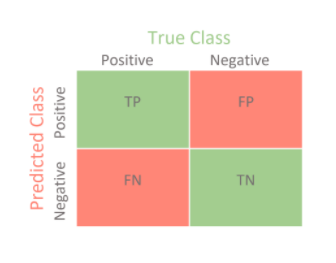

PRECISION=TPTP+FP

RECALL = TPTP+FN

F1 = 2 * PRECISION*RECALLPRECISION + RECALL


In [ ]:
try:
    expLog
except NameError:
    expLog = pd.DataFrame(columns=["exp_name", 
                                   "Train Acc", 
                                   "Test  Acc",
                                   "Train AUC", 
                                   "Test  AUC",
                                   "Train F1",
                                   "Test F1"
                                  ])


In [ ]:
%%time 
np.random.seed(42)
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression())
    ])
model = full_pipeline_with_predictor.fit(X_train, y_train)

CPU times: user 20.4 s, sys: 2.95 s, total: 23.4 s
Wall time: 13.4 s


In [ ]:
from sklearn.metrics import accuracy_score
np.round(accuracy_score(y_train, model.predict(X_train)), 3)
from sklearn.metrics import roc_auc_score
np.round(roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),3)

0.742

In [ ]:


exp_name = "Baseline Model"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model.predict(X_train)), 
                accuracy_score(y_test, model.predict(X_test)),
                roc_auc_score(y_train, model.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model.predict(X_test), average='weighted'),
                f1_score(y_test, model.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC
0,Baseline Model,0.9193,0.9194,0.7418,0.7432


In [ ]:
del expLog

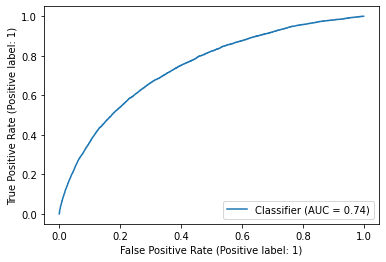

0.8828641368046117

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, model.predict_proba(X_test)[:, 1])
plt.show()

from sklearn.metrics import f1_score
f1_score(y_test, model.predict(X_test), average='weighted')


<Figure size 432x288 with 0 Axes>

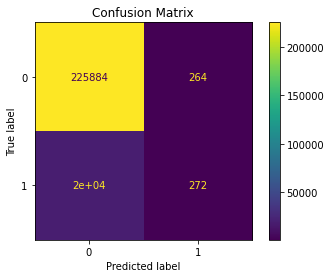

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model, X_train, y_train)
plt.title('Confusion Matrix')
plt.show()

<Figure size 432x288 with 0 Axes>

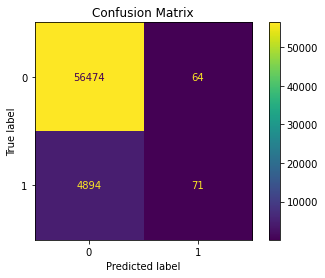

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model, X_test, y_test)
plt.title('Confusion Matrix')
plt.show()

In [ ]:
y_test.value_counts()

0    56538
1     4965
Name: TARGET, dtype: int64

# Hyperparameter tuning for models

## Logistics regression model

The logistic regression is passed through the Grid Search CV to find us the best parameters, the parameters for the pramas grid for the initial search in GridSearchCV are :
CSList=[10,100]
Regulars=[‘l1’,’l2’]
Solvers=[‘liblinear’]

### Best parameters:
The best parameters decided by the GridSearchCV for Cross Validation= 5 is 
{‘linear__C’:100, ‘linear_Penalty’: ‘l2’, ‘linear__solver’: ‘liblinear’}

### The metrics for the best parameters are
Train Accuracy: 0.9192
Test Accuracy: 0.9193
Train AUC: 0.7421
Test AUC: 0.7431
Train F1 Score: 0.8828
Test F1 Score: 0.8828


In [ ]:

from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegressionCV

Cslist = [10,100]
regulars = ['l1','l2']
solvers=['liblinear']
paramsgrid = {'linear__C':Cslist,
        'linear__penalty': regulars,
        'linear__solver': solvers}

jobs = -1
RF = GridSearchCV(full_pipeline_with_predictor,
            param_grid=paramsgrid,
            scoring='roc_auc',
            cv=5, 
            n_jobs=jobs)

grids = [RF]
RF.fit(X_train,y_train)



In [ ]:
RF.best_params_

{'linear__C': 100, 'linear__penalty': 'l2', 'linear__solver': 'liblinear'}

In [ ]:
exp_name = "Logreg crossvalidation best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, RF.predict(X_train)), 
                accuracy_score(y_test, RF.predict(X_test)),
                roc_auc_score(y_train, RF.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, RF.predict_proba(X_test)[:, 1]),
                f1_score(y_train, RF.predict(X_train), average='weighted'),
                f1_score(y_test, RF.predict(X_test), average='weighted')],
    4)) 
expLog


,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828


# XGboost model

### Best params: 
{'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__min_child_weight': 3}

In [ ]:
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
import xgboost
params={
 "xgb__learning_rate"    : [0.05, 0.10] ,
 "xgb__max_depth"        : [ 3,5],
 "xgb__min_child_weight" : [ 1, 3, 5]
}
classifier=xgboost.XGBClassifier()
full_pipeline_with_predictor_xgb = Pipeline([
        ("preparation", data_prep_pipeline),
        ("xgb", xgboost.XGBClassifier())
    ])
random_search=RandomizedSearchCV(full_pipeline_with_predictor_xgb,param_distributions=params,n_iter=10,scoring='accuracy',n_jobs=-1,cv=3,verbose=3)
random_search.fit(X_train,y_train)


random_search.best_estimator_

random_search.best_params_


Fitting 3 folds for each of 10 candidates, totalling 30 fits


{'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__min_child_weight': 3}

<Figure size 432x288 with 0 Axes>

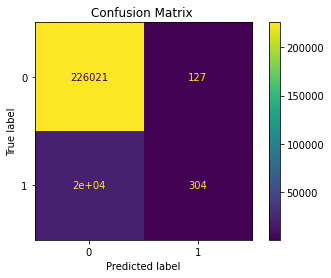

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(random_search, X_train, y_train)
plt.title('Confusion Matrix ')
plt.show()



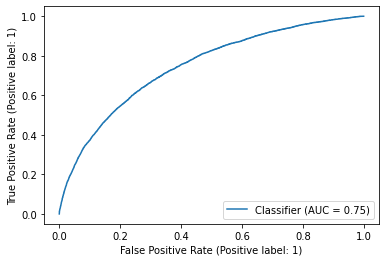

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, random_search.predict_proba(X_test)[:, 1])
plt.show()


In [ ]:
exp_name = "XGBoost crossvalidation best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, random_search.predict(X_train)), 
                accuracy_score(y_test, random_search.predict(X_test)),
                roc_auc_score(y_train, random_search.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, random_search.predict_proba(X_test)[:, 1]),
                f1_score(y_train, random_search.predict(X_train), average='weighted'),
                f1_score(y_test, random_search.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828
1,XGBoost crossvalidation best,0.9200,0.9199,0.7652,0.7466,0.8833,0.8830


# Random Forest model

The Random Forest classification is passed through  GridSearchCV to find the best parameters, the parameters for the pramas grid for the initial search in GridSearchCV are :
‘Rmf__bootstrap’: [True]
‘Rmf__max_depth’ : [10,20]
‘Rmf__max_features’ : [2,3]
‘Rmf__n_estimators’ : [100,200]

Best parameters:
The best parameters decided by the GridSearchCV for Cross Validation= 3 are:
{'rmf__bootstrap': True,
 'rmf__max_depth': 20,
 'rmf__max_features': 3,
 'rmf__n_estimators': 100}


In [ ]:
from sklearn.ensemble import RandomForestClassifier
full_pipeline_with_predictor_rf = Pipeline([
        ("preparation", data_prep_pipeline),
        ("rmf", RandomForestClassifier())
    ])
param_grid = {
    'rmf__bootstrap': [True],
    'rmf__max_depth': [10, 20],
    'rmf__max_features': [2, 3],
    'rmf__n_estimators': [100, 200]
}

grid_search = GridSearchCV(estimator=full_pipeline_with_predictor_rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [ ]:
grid_search.fit(X_train,y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits


GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('preparation',
                                        FeatureUnion(transformer_list=[('num_pipeline',
                                                                        Pipeline(steps=[('selector',
                                                                                         DataFrameSelector(attribute_names=['EXT_SOURCE_2',
                                                                                                                            'EXT_SOURCE_3',
                                                                                                                            'cc_CNT_DRAWINGS_ATM_CURRENT_sum',
                                                                                                                            'cc_CNT_DRAWINGS_ATM_CURRENT_mean',
                                                                                                                            'cc_CNT_DRAWIN

In [ ]:
grid_search.best_params_

{'rmf__bootstrap': True,
 'rmf__max_depth': 20,
 'rmf__max_features': 3,
 'rmf__n_estimators': 100}

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score


exp_name = "Random Forest crossvalidation best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, grid_search.predict(X_train)), 
                accuracy_score(y_test, grid_search.predict(X_test)),
                roc_auc_score(y_train, grid_search.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, grid_search.predict_proba(X_test)[:, 1]),
                f1_score(y_train, grid_search.predict(X_train), average='weighted'),
                f1_score(y_test, grid_search.predict(X_test), average='weighted')],
    4)) 
expLogb

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828
1,XGBoost crossvalidation best,0.9200,0.9199,0.7652,0.7466,0.8833,0.8830
2,Random Forest crossvalidation best,0.9223,0.9193,0.9065,0.7105,0.8877,0.8806


In [ ]:
grid_search.best_params_

{'rmf__bootstrap': True,
 'rmf__max_depth': 20,
 'rmf__max_features': 3,
 'rmf__n_estimators': 100}

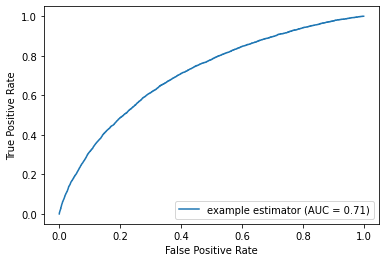

In [ ]:
import matplotlib.pyplot as plt
from sklearn import metrics
y_pred=grid_search.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = metrics.roc_curve(y_test, y_pred)
roc_auc = metrics.auc(fpr, tpr)
display = metrics.RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc,                                          estimator_name='example estimator')
display.plot()  
plt.show()      


<Figure size 432x288 with 0 Axes>

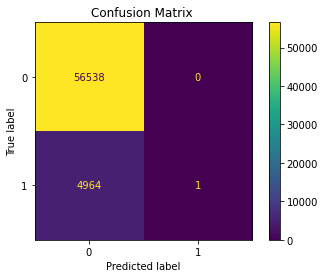

In [ ]:
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
plt.clf()
plot_confusion_matrix(grid_search,X_test, y_test)
plt.title('Confusion Matrix ')
plt.show()

In [ ]:
import joblib
joblib.dump(random_search, 'xgboost.pkl')
joblib.dump(grid_search, 'randomforest.pkl')
joblib.dump(RF, 'logisticsmodel.pkl')

['logisticsmodel.pkl']

## Saving the models

In [ ]:
model_xgb=joblib.load('xgboost.pkl')
model_log=joblib.load('logisticsmodel.pkl')
model_rf=joblib.load('randomforest.pkl')

In [ ]:
sk_id=['SK_ID_CURR']

In [ ]:
app_test_df_final=app_test_df[sk_id+numvar_top50+catvars+engg_features]
y_pred_kaggle_xgb=random_search.predict(app_test_df_final)
y_pred_kaggle_log=model_log.predict(app_test_df_final)
y_pred_kaggle_rf=model_rf.predict(app_test_df_final)



In [ ]:
app_test_df_final.head(2)

,SK_ID_CURR,EXT_SOURCE_2,EXT_SOURCE_3,cc_CNT_DRAWINGS_ATM_CURRENT_sum,cc_CNT_DRAWINGS_ATM_CURRENT_mean,cc_CNT_DRAWINGS_ATM_CURRENT,cc_CNT_DRAWINGS_ATM_CURRENT_max,cc_CNT_DRAWINGS_ATM_CURRENT_min,bur_DAYS_CREDIT,bur_DAYS_CREDIT_sum,bur_DAYS_CREDIT_max,bur_DAYS_CREDIT_mean,bur_DAYS_CREDIT_min,cc_AMT_BALANCE_sum,cc_AMT_BALANCE_mean,cc_AMT_BALANCE,cc_AMT_BALANCE_min,cc_AMT_BALANCE_max,cc_AMT_TOTAL_RECEIVABLE_max,cc_AMT_TOTAL_RECEIVABLE_sum,cc_AMT_TOTAL_RECEIVABLE,cc_AMT_TOTAL_RECEIVABLE_mean,cc_AMT_TOTAL_RECEIVABLE_min,cc_AMT_RECIVABLE_max,cc_AMT_RECIVABLE_min,cc_AMT_RECIVABLE,cc_AMT_RECIVABLE_mean,cc_AMT_RECIVABLE_sum,cc_AMT_RECEIVABLE_PRINCIPAL_sum,cc_AMT_RECEIVABLE_PRINCIPAL_max,cc_AMT_RECEIVABLE_PRINCIPAL_min,cc_AMT_RECEIVABLE_PRINCIPAL_mean,cc_AMT_RECEIVABLE_PRINCIPAL,cc_CNT_DRAWINGS_CURRENT_max,cc_CNT_DRAWINGS_CURRENT,cc_CNT_DRAWINGS_CURRENT_min,cc_CNT_DRAWINGS_CURRENT_sum,cc_CNT_DRAWINGS_CURRENT_mean,bur_CREDIT_ACTIVE_Closed_sum,bur_CREDIT_ACTIVE_Closed,...,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,pa_APPLICATION_CREDIT_DIFF,pa_APPLICATION_CREDIT_RATIO,pa_CREDIT_TO_ANNUITY_RATIO,pa_DOWN_PAYMENT_TO_CREDIT,cc_LIMIT_USE,cc_PAYMENT_DIV_MIN,cc_LATE_PAYMENT,cc_DRAWING_LIMIT_RATIO,pos_LATE_PAYMENT,ins_PAID_OVER_AMOUNT,ins_DBD,ins_LATE_PAYMENT,ins_INSTALMENT_PAYMENT_RATIO,ins_LATE_PAYMENT_RATIO,ins_SIGNIFICANT_LATE_PAYMENT,bur_CREDIT_DURATION,bur_ENDDATE_DIFF,bur_UPDATE_DIFF,bur_DEBT_PERCENTAGE,bur_DEBT_CREDIT_DIFF,bur_CREDIT_TO_ANNUITY_RATIO,bur_DEBT_TO_ANNUITY_RATIO,bur_CREDIT_OVERDUE_DIFF,appcount
0,100001,0.789551,0.159546,NaN,NaN,NaN,NaN,NaN,-735.000,-735.000,-735.000,-735.000,-735.000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.571289,0.571289,...,Cash loans,F,N,Y,Unaccompanied,Working,Higher education,Married,House / apartment,NaN,TUESDAY,Kindergarten,NaN,block of flats,"Stone, brick",No,1048.5,1.043945,6.019531,0.105957,NaN,NaN,NaN,NaN,1.0,0.0,8.0,1.0,1.0,1.0,1.0,817.5,908.0,175.625,2.435726,122382.648438,58.562103,24.042974,207623.578125,7.0
1,100005,0.291748,0.432861,NaN,NaN,NaN,NaN,NaN,-190.625,-190.625,-190.625,-190.625,-190.625,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.333252,0.333252,...,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Low-skill Laborers,FRIDAY,Self-employed,NaN,NaN,NaN,NaN,2232.0,1.111328,4.171875,0.222290,NaN,NaN,NaN,NaN,0.0,0.0,23.5,1.0,1.0,1.0,1.0,630.0,562.0,493.500,1.156080,29572.500000,154.200638,133.382263,219042.000000,3.0


In [ ]:
submission = pd.DataFrame({

        "SK_ID_CURR": app_test_df_final["SK_ID_CURR"],

        "TARGET": y_pred_kaggle_xgb

    })
submission_log = pd.DataFrame({

        "SK_ID_CURR": app_test_df_final["SK_ID_CURR"],

        "TARGET": y_pred_kaggle_log

    })
submission_rf = pd.DataFrame({

        "SK_ID_CURR": app_test_df_final["SK_ID_CURR"],

        "TARGET": y_pred_kaggle_rf

    })
submission.to_csv('submission.csv', index=False)
submission_log.to_csv('submission_log.csv', index=False)
submission_rf.to_csv('submission_rf.csv', index=False)

## Resampling of the data for balancing target variabale

In [ ]:
train_data = pd.concat([X_train, y_train], axis=1)
train_data.head()


from sklearn.utils import resample

zerodata = train_data[train_data.TARGET==0]
onedata = train_data[train_data.TARGET==1]

default_sampled_data = resample(zerodata,
                          replace=True,
                          n_samples=int(len(onedata)*1.5), 
                          random_state=123) 

train_data = pd.concat([onedata, default_sampled_data])

train_data.TARGET.value_counts()

0    29790
1    19860
Name: TARGET, dtype: int64

In [ ]:
y=train_data['TARGET']
X=train_data.drop(['TARGET'],axis=1)
print(X.shape,train_data.shape)
X_train_n, X_test_n, y_train_n, y_test_n = train_test_split(X, y, test_size=0.20, random_state=42,stratify=y)

(49650, 90) (49650, 91)


## Linear model with best params for balanced data

In [ ]:
full_pipeline_with_predictor = Pipeline([
        ("preparation", data_prep_pipeline),
        ("linear", LogisticRegression(C=100,penalty='l2',solver='liblinear'))
    ])
model_log_balanced = full_pipeline_with_predictor.fit(X_train_n, y_train_n)


In [ ]:
exp_name = "Logreg balanced best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_log_balanced.predict(X_train)), 
                accuracy_score(y_test, model_log_balanced.predict(X_test)),
                roc_auc_score(y_train, model_log_balanced.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_log_balanced.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_log_balanced.predict(X_train), average='weighted'),
                f1_score(y_test, model_log_balanced.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828
1,XGBoost crossvalidation best,0.9200,0.9199,0.7652,0.7466,0.8833,0.8830
2,Random Forest crossvalidation best,0.9223,0.9193,0.9065,0.7105,0.8877,0.8806
3,Logreg balanced best,0.7954,0.7973,0.7427,0.7427,0.8325,0.8338


<Figure size 432x288 with 0 Axes>

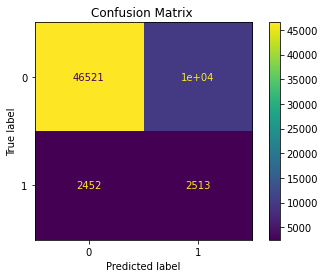

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_log_balanced, X_test, y_test)
plt.title('Confusion Matrix ')
plt.show()



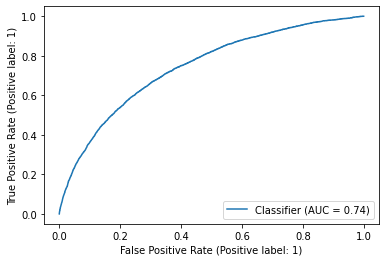

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, model_log_balanced.predict_proba(X_test)[:, 1])
plt.show()

## XGboost model with best params for balanced data

In [ ]:
full_pipeline_xgb_balanced = Pipeline([
        ("preparation", data_prep_pipeline),
        ("xgb", xgboost.XGBClassifier(learning_rate=0.1,max_depth=5,min_child_weight=3))
    ])
model_xgb_balanced = full_pipeline_xgb_balanced.fit(X_train_n, y_train_n)


In [ ]:
exp_name = "XGB balanced best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_xgb_balanced.predict(X_train)), 
                accuracy_score(y_test, model_xgb_balanced.predict(X_test)),
                roc_auc_score(y_train, model_xgb_balanced.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_xgb_balanced.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_xgb_balanced.predict(X_train), average='weighted'),
                f1_score(y_test, model_xgb_balanced.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828
1,XGBoost crossvalidation best,0.9200,0.9199,0.7652,0.7466,0.8833,0.8830
2,Random Forest crossvalidation best,0.9223,0.9193,0.9065,0.7105,0.8877,0.8806
3,Logreg balanced best,0.7954,0.7973,0.7427,0.7427,0.8325,0.8338
4,XGB balanced best,0.7916,0.7899,0.7623,0.7437,0.8308,0.8291


<Figure size 432x288 with 0 Axes>

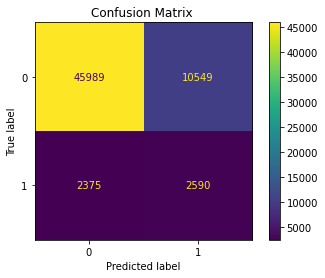

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_xgb_balanced, X_test, y_test)
plt.title('Confusion Matrix ')
plt.show()


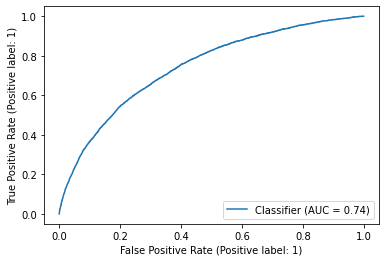

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, model_xgb_balanced.predict_proba(X_test)[:, 1])
plt.show()

## Random Forest model with best params for balanced data

In [ ]:
full_pipeline_RF_balanced = Pipeline([
        ("preparation", data_prep_pipeline),
        ("rmf", RandomForestClassifier(bootstrap=True,max_depth=20,n_estimators=100))
    ])
model_RF_balanced = full_pipeline_RF_balanced.fit(X_train_n, y_train_n)

In [ ]:
exp_name = "RF balanced best"
expLog.loc[len(expLog)] = [f"{exp_name}"] + list(np.round(
               [accuracy_score(y_train, model_RF_balanced.predict(X_train)), 
                accuracy_score(y_test, model_RF_balanced.predict(X_test)),
                roc_auc_score(y_train, model_RF_balanced.predict_proba(X_train)[:, 1]),
                roc_auc_score(y_test, model_RF_balanced.predict_proba(X_test)[:, 1]),
                f1_score(y_train, model_RF_balanced.predict(X_train), average='weighted'),
                f1_score(y_test, model_RF_balanced.predict(X_test), average='weighted')],
    4)) 
expLog

,exp_name,Train Acc,Test Acc,Train AUC,Test AUC,Train F1,Test F1
0,Logreg crossvalidation best,0.9192,0.9193,0.7421,0.7431,0.8828,0.8828
1,XGBoost crossvalidation best,0.9200,0.9199,0.7652,0.7466,0.8833,0.8830
2,Random Forest crossvalidation best,0.9223,0.9193,0.9065,0.7105,0.8877,0.8806
3,Logreg balanced best,0.7954,0.7973,0.7427,0.7427,0.8325,0.8338
4,XGB balanced best,0.7916,0.7899,0.7623,0.7437,0.8308,0.8291
5,RF balanced best,0.8346,0.7978,0.8878,0.7279,0.8649,0.8335


<Figure size 432x288 with 0 Axes>

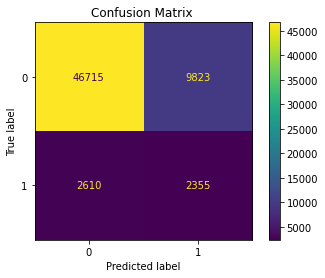

In [ ]:
from sklearn.metrics import plot_confusion_matrix
plt.clf()
plot_confusion_matrix(model_RF_balanced, X_test, y_test)
plt.title('Confusion Matrix ')
plt.show()

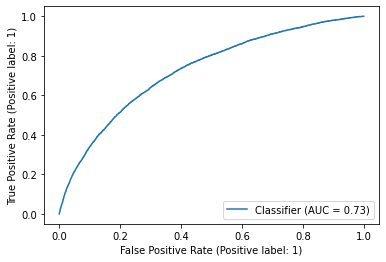

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(y_test, model_RF_balanced.predict_proba(X_test)[:, 1])
plt.show()

In [ ]:
joblib.dump(model_xgb_balanced, 'xgboost_balanced.pkl')
joblib.dump(model_RF_balanced, 'RF_balanced.pkl')
joblib.dump(model_log_balanced, 'logisticsmodel_balanced.pkl')

['logisticsmodel_balanced.pkl']

In [ ]:
model_rf=joblib.load('RF_balanced.pkl')
app_test_df_final=app_test_df[sk_id+numvar_top50+catvars+engg_features]
y_pred_kaggle_rf=model_rf.predict(app_test_df_final)
submission_rf = pd.DataFrame({

        "SK_ID_CURR": app_test_df_final["SK_ID_CURR"],

        "TARGET": y_pred_kaggle_rf

    })

In [ ]:
submission_rf.to_csv('submission_rf.csv', index=False)

In [ ]:
model_xgb=joblib.load('xgboost_balanced.pkl')
app_test_df_final=app_test_df[sk_id+numvar_top50+catvars+engg_features]
y_pred_kaggle_xgb=model_xgb.predict(app_test_df_final)
submission_xgb = pd.DataFrame({

        "SK_ID_CURR": app_test_df_final["SK_ID_CURR"],

        "TARGET": y_pred_kaggle_xgb

    })

In [ ]:
submission_xgb.to_csv('submission_xgb.csv', index=False)

## Loss Functions


 Cross Entropy Loss:    $\frac{-1}{N}\sum_{i=1}^{N}y_i.log(p(y_i)) + log(1-p(y_i))$

In [ ]:
try:
    loss
except NameError:
    loss = pd.DataFrame(columns=["exp_name", 
                                   "Train loss", 
                                   "Test  loss",
                                  ])

In [ ]:
from sklearn.metrics import log_loss

exp_name = "Logreg Log-loss"
loss.loc[len(loss)] = [f"{exp_name}"] + list(np.round(
               [log_loss(y_train,model_log_balanced.predict(X_train)), 
                log_loss(y_test,model_log_balanced.predict(X_test))],
    3)) 
loss

,exp_name,Train loss,Test loss
0,Logreg Log-loss,7.065,7.002


In [ ]:
exp_name = "Randomforest Log-loss"
loss.loc[len(loss)] = [f"{exp_name}"] + list(np.round(
               [log_loss(y_train,model_RF_balanced.predict(X_train)), 
                log_loss(y_test,model_RF_balanced.predict(X_test))],
    3)) 

exp_name = "XGB Log-loss"
loss.loc[len(loss)] = [f"{exp_name}"] + list(np.round(
               [log_loss(y_train,model_xgb_balanced.predict(X_train)), 
                log_loss(y_test,model_xgb_balanced.predict(X_test))],
    3)) 
loss


,exp_name,Train loss,Test loss
0,Logreg Log-loss,7.065,7.002
1,Randomforest Log-loss,5.713,6.982
2,XGB Log-loss,7.198,7.258


# Kaggle Submissions:


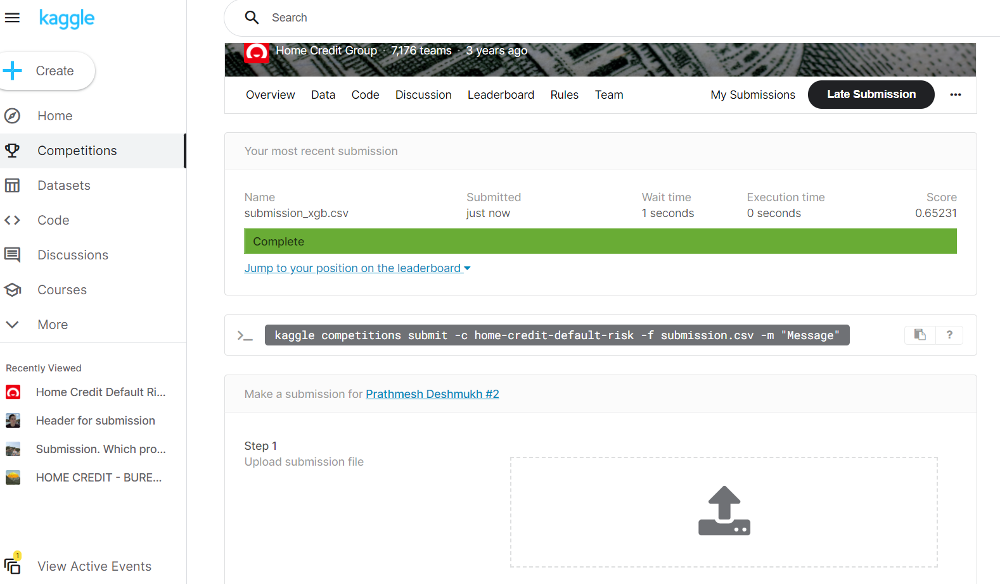

# Neural Networks

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as func
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    print("GPU NAME --> ", torch.cuda.get_device_name(0))

GPU NAME -->  Tesla K80


In [ ]:
def model(hidden1,hidden2):
    model= torch.nn.Sequential(
           torch.nn.Linear(input_layer,hidden1),
           torch.nn.Sigmoid(),
           torch.nn.Linear(hidden1,hidden2),
           torch.nn.Sigmoid(),
           torch.nn.Linear(hidden2,1),
           torch.nn.Sigmoid()
           )
    return model

In [ ]:
device=torch.device('cuda')
mymodel=model(128,64)
mymodel.to(device=device)

Sequential(
  (0): Linear(in_features=188, out_features=128, bias=True)
  (1): Sigmoid()
  (2): Linear(in_features=128, out_features=64, bias=True)
  (3): Sigmoid()
  (4): Linear(in_features=64, out_features=1, bias=True)
  (5): Sigmoid()
)

In [ ]:
X_train_transformed = torch.FloatTensor(X_train_transformed).to(device=device)
y_train_n2 = torch.FloatTensor(y_train_n2).to(device=device)

In [ ]:
criterion = torch.nn.BCEWithLogitsLoss()
lr=0.01
# dtloader = torch.utils.data.DataLoader(X_train_transformed, batch_size=400)
train_data = []
for i in range(len(X_train_transformed)):
   train_data.append([X_train_transformed[i], y_train_n2[i]])
print(len(train_data[1]))
trainloader = torch.utils.data.DataLoader(train_data, shuffle=True, batch_size=400)
for i,j in trainloader:
  print(i.shape,j.shape)
  break
# trainloader=trainloader.to(device=device)
# i1, l1 = next(iter(trainloader))
# print(i1.shape)
optimizer = torch.optim.SGD(mymodel.parameters(), lr=lr)


2
torch.Size([400, 188]) torch.Size([400])


In [ ]:
print(train_data[0][0].shape
)

torch.Size([188])


In [ ]:
%reload_ext tensorboard
writer = SummaryWriter('runs/working_directory')

EPOCHS=500

In [ ]:
def binary_acc(y_pred, y_test):
    y_pred_tag = torch.round(torch.sigmoid(y_pred))
    correct_results_sum = (y_pred_tag == y_test).sum().float()
    acc = correct_results_sum/y_test.shape[0]
    acc = torch.round(acc * 100)
    return acc

In [ ]:
for e in range(EPOCHS):
    running_loss = 0
    for X, y in trainloader:
        output = mymodel(X)
        # print(X.shape,y.shape)
        loss = criterion(output, y.reshape(output.shape[0],1))
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        y_pred = mymodel(X)
        acc = binary_acc(y_pred, y.unsqueeze(1))
        running_loss += loss.item()
    if(e%50==0):
      print("Epoch {} — Training loss: {} — Accuracy : {}".format(e,running_loss/len(trainloader),acc))
    writer.add_scalar("loss x epoch",running_loss/len(trainloader), e)
    writer.add_scalar("accuracy x epoch",acc, e)
writer.close()

Epoch 0 — Training loss: 0.7415988922119141 — Accuracy : 38.0
Epoch 50 — Training loss: 0.6941023081541061 — Accuracy : 36.0
Epoch 100 — Training loss: 0.6936052978038788 — Accuracy : 40.0
Epoch 150 — Training loss: 0.6934448528289795 — Accuracy : 39.0
Epoch 200 — Training loss: 0.6933666962385178 — Accuracy : 35.0
Epoch 250 — Training loss: 0.6933183991909027 — Accuracy : 48.0
Epoch 300 — Training loss: 0.693288523554802 — Accuracy : 43.0
Epoch 350 — Training loss: 0.6932674878835678 — Accuracy : 38.0
Epoch 400 — Training loss: 0.6932509887218475 — Accuracy : 43.0
Epoch 450 — Training loss: 0.6932394617795944 — Accuracy : 31.0


In [ ]:
# X_test_transformed=data_prep_pipeline.transform(X_test_transformed)
X_test_transformed=torch.FloatTensor(X_test_transformed).to(device=device)


In [ ]:
y_test_n=np.array(y_test_n)
y_test_n = torch.FloatTensor(y_test_n).to(device=device)

In [ ]:
y_pred_test=mymodel(X_test_transformed)
Test_acc = binary_acc(y_pred_test, y_test_n.unsqueeze(1))
print("Accuracy on test dataset is ",Test_acc.item())

Accuracy on test dataset is  40.0


In [ ]:
%tensorboard --logdir=runs

Reusing TensorBoard on port 6006 (pid 818), started 0:08:24 ago. (Use '!kill 818' to kill it.)

<IPython.core.display.Javascript object>

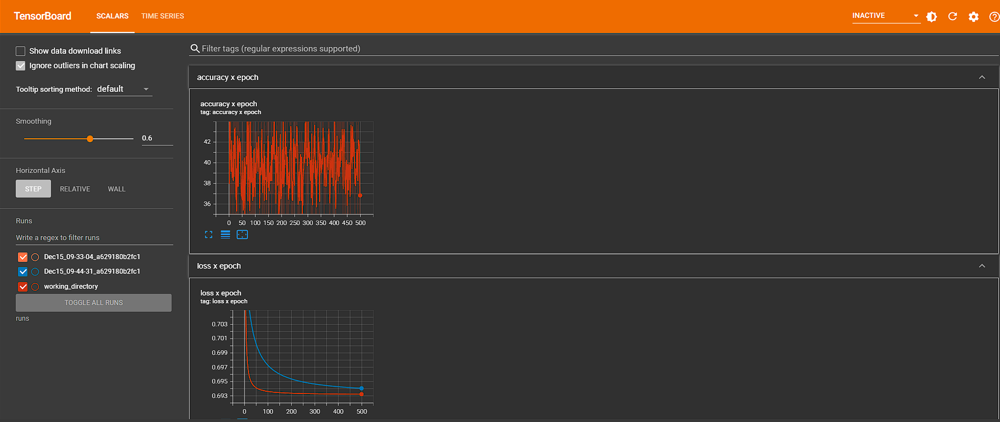

## Kaggle Submission

In [ ]:
tester_data=pd.read_pickle("app_test_df.pkl")
sk_id=tester_data['SK_ID_CURR']
# lst.remove('TARGET')
tester_data=tester_data[lst]
tester_data=data_prep_pipeline.transform(tester_data)
tester_data2=torch.FloatTensor(tester_data).to(device=device)

# list(set(trainer_data.columns)-set(tester_data.columns))

# trainer_data=pd.read_pickle("app_df_final.pkl")
# print(trainer_data.shape)
# # sk_id_full=trainer_data['SK_ID_CURR']
# trainer_data=trainer_data[numvar_top50+catvars+engg_features]
# trainer_data=data_prep_pipeline.fit_transform(trainer_data)
# trainer_data2=torch.FloatTensor(trainer_data).to(device=device)

In [ ]:
tester_data.shape

(48744, 188)

In [ ]:
y_pred_test_kaggle=mymodel(tester_data2)
y_pred_test_kaggle = torch.round((y_pred_test_kaggle))
sk_id=sk_id.to_frame()
sk_id["TARGET"]=pd.DataFrame(y_pred_test_kaggle.cpu().detach().numpy())
sk_id.to_csv("MLP.csv")

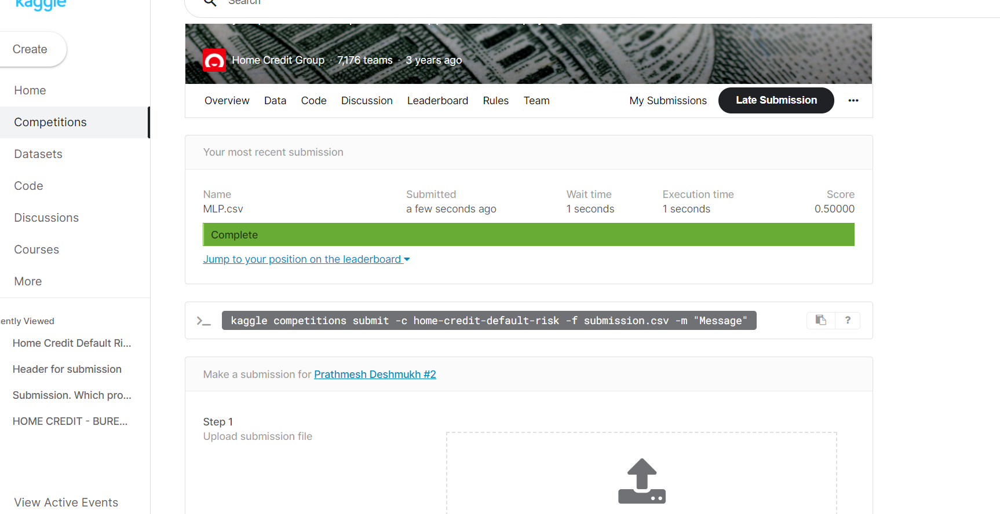

# Write-up

# Abstract:

Home Credit Default Risk is a project where we determine the credit worthiness of people that have applied for the loans. In previous phases, we had completed basic EDA, Feature Engineering and ran the baseline model for logistic regression and the hyperparameter tuning for XGBoost model.
In this Phase, we have significantly improved our project. We have updated the EDA, implemented robust Feature engineering for all dataset files, and did experimental analysis for hyper-parameter tuning for Logistic Regression, XGBoost and Random Forest Models. We conducted experiments using both original imbalanced data as well as resampled data. After comparison we found out that the XGBoost model with parameters: { learning_rate: 0.1, max_depth=5, min_child_weight=3 } was the best model, using the model performance criteria of Test AUC Score (0.7427). 
For the deep learning Pytorch model, we used a feed-forward MLP with two hidden layers of 128 and 64 neurons each. We used a sigmoid activation function and SGD optimizer with cross entropy as loss function. The model achieved the test accuracy of 40%. The best Kaggle submission that we obtained was from XGBoost model with the Private Score 0.64788 and Public Score of 0.65231. 

# Team Members:

Team Information
Bhushan Patil	Vaibhav Vishwanath
	Gavin Henry Lewis
	Prathamesh Deshmukh

bpatil@iu.edu!
	vavish@iu.edu
	gavlewis@iu.edu
	pdeshmukh@iu.edu

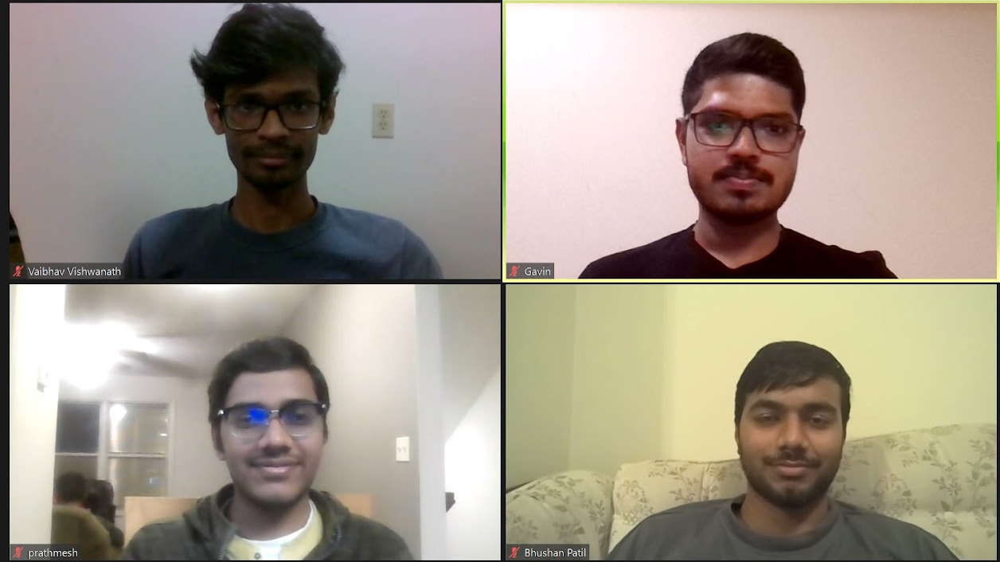  	  	  	  
				
				




# Project Description

## Data Description 
Background Home Credit Group
Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

## Home Credit Group

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.
While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.
## Background on the dataset
Home Credit is a non-banking financial institution, founded in 1997 in the Czech Republic.
The company operates in 14 countries (including United States, Russia, Kazahstan, Belarus, China, India) and focuses on lending primarily to people with little or no credit history which will either not obtain loans or became victims of untrustworthly lenders.
Home Credit group has over 29 million customers, total assests of 21 billions Euro, over 160 millions loans, with the majority in Asia and and almost half of them in China (as of 19-05-2018).
While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

## Data files overview
There are 7 different sources of data:

1. application_train/application_test: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid. The target variable defines if the client had payment difficulties meaning he/she had late payment more than X days on at least one of the first Y installments of the loan. Such case is marked as 1 while other all other cases as 0.
2. bureau: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
3. bureau_balance: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
4. previous_application: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
5. POS_CASH_BALANCE: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
6. credit_card_balance: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
7. installments_payment: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

Part B: Tasks to be tackled during this phase
1.	Robust Feature Engineering on all data files
2.	Exploring different models with hyperparameter tuning and selection of best model based on performance metrics such as AUC and F1.
3.	Optimization of input data for efficient memory usage and avoiding kernel crashes.
4.	Implementation of MLP model and tensorboard for visualization of model training.
5.	Kaggle submission for both the best model and the MLP model.

### Workflow Diagram For entire Project

 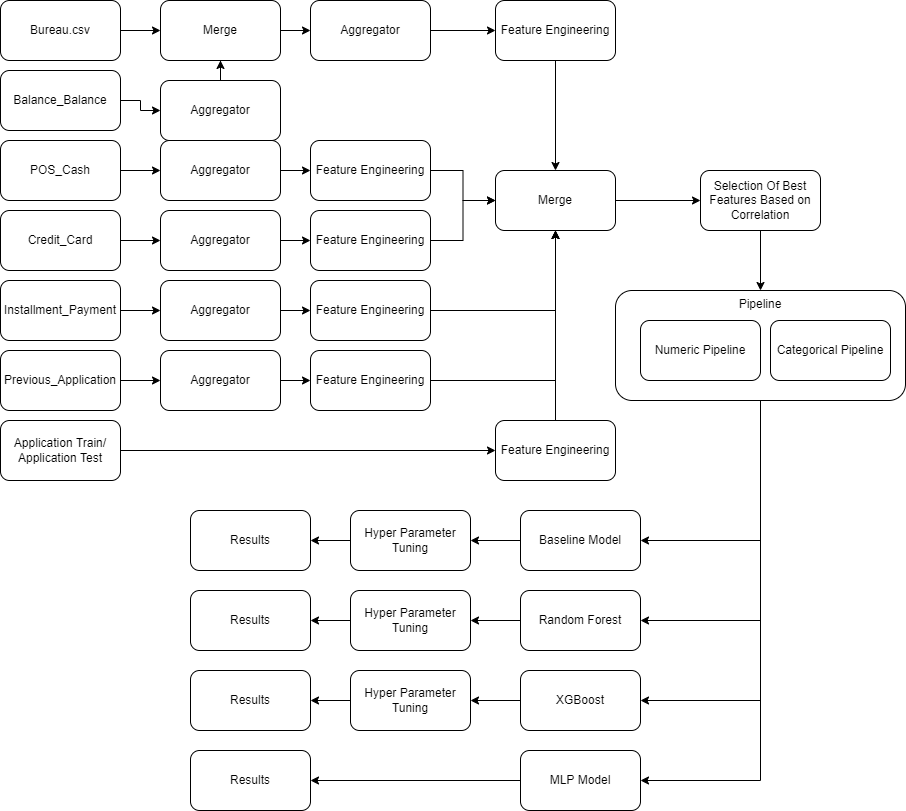






## Neural networks
 
Fig: Sample visualization of Neural Network Architecture Designed

## Architecture Of Neural Network:
The neural network has 4 layers: 
Layer 1: 188 neurons (Input Layer)    
Layer 2: 128 neurons				Activation function: Sigmoid
Layer 3: 64 neurons				Activation function: Sigmoid
Layer 4: 1 neuron (Output Layer)		Activation function: Sigmoid

## Hyper Parameters:
Learning Rate= 0.01
Batch Size =400
Optimizer= SGD
Loss Function= Cross Entropy Loss (BCEwithLogitsLoss())

We trained the model for 500 epochs and the training loss converged to 0.69 starting with 0.74. The accuracy was fluctuating in the range of 30-50. We achieved the test accuracy of 40% on the trained model. Since the model was run only for resampled balanced data with only 50,000 training samples. This is why were are getting lower accuracies, and found out that the traditional algorithms were performing better.
Tensor board Dashboard for training visualization:
 

## Data Leakage Control (HCDR):
We performed feature engineering on secondary datasets and merged with application train and application test. For feature selection from application train, we selected top 50 numeric features based on the correlation with target variable. All the numeric features as well as the engineered features were part of the final dataset. 
We used pipelines to avoid the data leakage during preprocessing of numeric and categorical features. All the models were built with data pipeline + estimator as a single pipeline for Cross Validation purposes.

## Modelling Pipelines: 
 
Families of Input Features:
Inputs used for the modelling primarily consists of following:

### Engineered Features:
Total count of engineered features is 24. This is the set of input features derived from data files other than application_train. The top 5 most correlated features are: 
1.	cc_LIMIT_USE: total used credit as a percentage of total limit 
2.	cc_DRAWING_LIMIT_RATIO: Ratio of total drawings of the month with credit limit amount
3.	ins_INSTALMENT_PAYMENT_RATIO: ratio of actual installment payment and prescribed installment amount
4.	ins_LATE_PAYMENT_RATIO : Installment payment ratio of late payments
5.	bur_UPDATE_DIFF: Difference between the credit end date and last update date

### Numeric Features:
We have considered top 50 correlated numeric features. These are the set of numeric features from application_train as well as aggregated features from secondary datasets. Top 5 highly correlated features are:
1.	EXT_SOURCE_3                         
2.	EXT_SOURCE_2                           
3.	cc_CNT_DRAWINGS_ATM_CURRENT_sum         
4.	cc_CNT_DRAWINGS_ATM_CURRENT_mean        
5.	cc_CNT_DRAWINGS_ATM_CURRENT         
    


### Categorical Features:
We considered the categorical features from the application train dataset, the total count of categorical features is 16. 

Hyperparameter Settings:
Logistic Regression
Cslist = [10,100]
regulars = ['l1','l2']
solvers=['liblinear']
paramsgrid = {'linear__C':Cslist,
        'linear__penalty': regulars,
        'linear__solver': solvers}

XGBoost
params={
 "xgb__learning_rate"    : [0.05, 0.10] ,
 "xgb__max_depth"        : [ 3,5],
 "xgb__min_child_weight" : [ 1, 3, 5]
}


Random Forest:
param_grid = {
    'rmf__bootstrap': [True],
    'rmf__max_depth': [10, 20],
    'rmf__max_features': [2, 3],
    'rmf__n_estimators': [100, 200]
}

MLP:
Learning Rate= 0.01
Batch Size =400
Optimizer= SGD
Loss Function= Cross Entropy Loss (BCEwithLogitsLoss())




# Loss Functions: 

L1 Regularization 

$\sum_{i=0}^{N}(y_i-\sum_{j=0}^{M}x_{ij}W_j)^2 + \lambda\sum_{j=0}^{M}|W_j|$

L2 Regularization 
$\sum_{i=0}^{N}(y_i-\sum_{j=0}^{M}x_{ij}W_j)^2 + \lambda\sum_{j=0}^{M}W_j^2$

## Experiments Conducted:

1. Baseline Experiment:
Baseline model is a logistics regression model with no hyperparameter tuning to establish a baseline. Baseline model performed with the accuracy of 91.93%, 


exp_name	Train Acc	Test Acc	Train AUC	Test AUC
Baseline Model	0.9193	0.9194	0.7418	0.7432

2. Logistic Regression model with GridsearchCV:
We created a modelling pipeline for preprocessing + logistic regressor, this was then passed on to a GridSearchCV with a set of hyperparameters and CV=5. Test score was calculated on the best parameters.
Best parameters:
The best parameters decided by the GridSearchCV for Cross Validation= 5 are 
{‘linear__C’:100, ‘linear_Penalty’: ‘l2’, ‘linear__solver’: ‘liblinear’}
Model score for different evaluation criterion
exp_name	Train Acc	Test Acc	Train AUC	Test AUC	Train F1	Test F1
Logreg crossvalidation best	0.9192	0.9193	0.7421	0.7431	0.8828	0.8828

Model did not perform particularly well with unbalanced label(Target=1)


3. XGBoost model with GridsearchCV:
XGboost model was created using the same data processing pipeline with XGBClassifier as a estimator. Model was run for the set of hyperparameters and then the test score was calculated using the best parameters given by the GridsearchCV
Hyperparamete 
 "xgb__learning_rate"    : [0.05, 0.10] ,
 "xgb__max_depth"        : [ 3,5],
 "xgb__min_child_weight" : [ 1, 3, 5]
Best Parameters:
{'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__min_child_weight': 3}

exp_name	Train Acc	Test Acc	Train AUC	Test AUC	Train F1	Test F1
XGBoost crossvalidation best	0.92	0.9199	0.7652	0.7466	0.8833	0.883

This model too performed poorly on the unbalanced label(Target=1) but the results bested the Logistics regressor with the test set F1 score of 0.883

4. Random Forest model with GridsearchCV:
Random forest model was created using the same data processing pipeline with RandomForestClassifier as an estimator. Model was run for the set of hyperparameters and then the test score was calculated using the best parameters given by the GridsearchCV
Hyperparamete:
param_grid = {
    'rmf__bootstrap': [True],
    'rmf__max_depth': [10, 20],
    'rmf__max_features': [2, 3],
    'rmf__n_estimators': [100, 200]
}

Best parameters:
{'rmf__bootstrap': True,
'rmf__max_depth': 20,
 'rmf__max_features': 3,
 'rmf__n_estimators': 100}

exp_name	Train Acc	Test Acc	Train AUC	Test AUC	Train F1	Test F1
Random Forest crossvalidation best	0.9223	0.9193	0.9065	0.7105	0.8877	0.8806

Random forest regressor performed well on the training set but failed to show the similar performance on the test set, which indicates a slight overfitting. 

## Data sampling for balancing the target variable:
We performed data sampling using sklearn’s resample module with the ratio of 2:3 for ‘1’ and ‘0’ target value. We re-ran all the models on best parameters on the new dataset and recalculated the score on evaluation criteria for test set. 

## Final Model Tuned:
Based on the AUC and F1 score on the test dataset, our final tuned model was the XGBoost model with following hyperparameters: 
{'xgb__learning_rate': 0.1, 'xgb__max_depth': 5, 'xgb__min_child_weight': 3}

# Results and Discussion:
Following table summarizes the model performances before and after data balancing:
exp_name	Train Acc	Test Acc	Train AUC	Test AUC	Train F1	Test F1
Logreg crossvalidation best	0.919	0.919	0.742	0.743	0.883	0.883
XGBoost crossvalidation best	0.920	0.920	0.765	0.747	0.883	0.883
Random Forest crossvalidation best	0.922	0.919	0.907	0.711	0.888	0.881
Logreg balanced best	0.795	0.797	0.743	0.743	0.833	0.834
XGB balanced best	0.792	0.790	0.762	0.744	0.831	0.829
RF balanced best	0.835	0.798	0.888	0.728	0.865	0.834




Loss based on models trained on balanced data:
exp_name	Train loss	Test loss
Logreg Log-loss	7.065	7.002
Randomforest Log-loss	5.713	6.982
XGB Log-loss	7.198	7.258

•	In this phase, we have improved on the Phase 2 submission by improving our EDA and implementing additional feature engineering on all the secondary datasets.
•	We also performed hyperparameter tuning on different models.
•	We improved on the model evaluation criteria as accuracy was giving a false representation of the goodness of fit. We have used F1 score and AUC as our primary model evaluators
•	We also implemented the Pytorch Deep Learning Model with 2 hidden layers.
•	We also did Kaggle Submissions for the Random Forest, XGBoost and the Neural Network model.
Public Kaggle Scores
XGBoost	0.65
Random Forest	0.64
MLP	0.50

 



# Conclusion:
The aim of the project is to determine individuals who are capable of repaying the loans. Our Machine Learning model is able to predict whether an individual should be given a loan or not on the basis of the applicant’s previous applications, credit bureau history, payment installments and other primary features such as sources of income, number of family members, dependents, etc. 
All the machine learning models trained with imbalanced data performed poorly for target value 1. Model was retrained using resampled data and predictions for Target value 1 significantly improved as evident from the confusion matrices. 
The Deep Learning Model which was created did not perform on par with the traditional machine learning models as we trained the model with a smaller subset of data (resampled). 
Our best performing model was the XGBoost Model with Test AUC score of 74.7%  and F1 score of 88.3%.The worst performing model was the MLP model.The best performing model had a Kaggle score of 65%.
 



# References

https://medium.com/analytics-vidhya/home-credit-default-risk-part-1-business-understanding-data-cleaning-and-eda-1203913e979c

https://towardsdatascience.com/confusion-matrix-for-your-multi-class-machine-learning-model-ff9aa3bf7826

https://www.kaggle.com/c/home-credit-default-risk/discussion/57750

https://www.kaggle.com/c/home-credit-default-risk/discussion/57912

